# Library

In [1]:
library(rvest)
library(httr)
library(tidyverse)
library(fastDummies)
library(RSQLite)
library(poissonreg)
library(ggthemes)
library(plotly)
library(tidymodels)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.2     ✔ tibble    3.3.0
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.1.0     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter()         masks stats::filter()
✖ readr::guess_encoding() masks rvest::guess_encoding()
✖ dplyr::lag()            masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Cargando paquete requerido: parsnip


Adjuntando el paquete: ‘plotly’


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:httr’:

    config


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout


── Attaching packages ───────────────────────────────────

# set up weather API for download the forcast

In [13]:
# Get forecast data for a given city list
get_weather_forecaset_by_cities <- function(city_names){
  # Create some empty vectors to hold data temporarily
  city_list <- list()
  weather_list <- list()
  visibility_list <- list()
  temp_list <- list()
  temp_min_list <- list()
  temp_max_list <- list()
  pressure_list <- list()
  humidity_list <- list()
  wind_speed_list <- list()
  wind_deg_list <- list()
  forecast_datetime_list <- list()
  season_list <- list()
  
  for (city_name in city_names){
    # Forecast API URL
    forecast_url <- 'https://api.openweathermap.org/data/2.5/forecast'
    # Create query parameters
    forecast_query <- list(q = city_name, appid = "a4e86aff1815cc4ad015989ac5604ecc", units="metric")
    # Make HTTP GET call for the given city
    response <- httr::GET(forecast_url, query=forecast_query)
    json_result <- httr::content(response, as="parsed")
    # Note that the 5-day forecast JSON result is a list of lists. You can print the reponse to check the results
    results <- json_result$list
    # Loop the json result
    for(result in results) {
      # Get city name
      city_list <- c(city_list, city_name)
      # Get weather status
      weather_list <- c(weather_list, result$weather[[1]]$main)
      # Get visibility
      visibility_list <- c(visibility_list, result$visibility)
      # Get current temperature
      temp_list <- c(temp_list, result$main$temp)
      # Get current min temperature
      temp_min_list <- c(temp_min_list, result$main$temp_min)
      # Get current max temperature
      temp_max_list <- c(temp_max_list, result$main$temp_max)
      # Get current pressure
      pressure_list <- c(pressure_list, result$main$pressure)
      # Get current humidity
      humidity_list <- c(humidity_list, result$main$humidity)
      # Get current wind speed
      wind_speed_list <- c(wind_speed_list, result$wind$speed)
      # Get current wind direction
      wind_deg_list <- c(wind_deg_list, result$wind$deg)
      # Get forecast timestamp
      datetime_obj <- as.POSIXct(result$dt_txt, tz="UTC")
      forecast_datetime_list <- c(forecast_datetime_list, datetime_obj)
      # Get season
      month <- as.numeric(format(datetime_obj, "%m"))
      if (month %in% c(3, 4, 5)) {
        season_list <- c(season_list, "Spring")
      } else if (month %in% c(6, 7, 8)) {
        season_list <- c(season_list, "Summer")
      } else if (month %in% c(9, 10, 11)) {
        season_list <- c(season_list, "Autumn")
      } else {
        season_list <- c(season_list, "Winter")
      }
    }
    
    # Add the R Lists into a data frame df
    df <- data.frame(city = unlist(city_list),
                     weather = unlist(weather_list),
                     visibility = unlist(visibility_list),
                     temp = unlist(temp_list),
                     temp_min = unlist(temp_min_list),
                     temp_max = unlist(temp_max_list),
                     pressure = unlist(pressure_list),
                     humidity = unlist(humidity_list),
                     wind_speed = unlist(wind_speed_list),
                     wind_deg = unlist(wind_deg_list),
                     # Aquí se asegura que forecast_datetime_list se convierta en un vector POSIXct
                     forecast_datetime = as.POSIXct(unlist(forecast_datetime_list), origin="1970-01-01", tz="UTC"),
                     season = unlist(season_list))
  }
  # Return a data frame
  return(df)
}


cities <- c("Seoul", "Washington, D.C.", "Paris", "Suzhou")
cities_weather_df <- get_weather_forecaset_by_cities(cities)
colnames(cities_weather_df) <- toupper(colnames(cities_weather_df))

# Write cities_weather_df to `cities_weather_forecast.csv`
write_csv(cities_weather_df, "Data/raw_cities_weather_forecast.csv")

# Data wranling

#### Download the dataset needed for the project

In [233]:
# Download raw_bike_sharing_systems.csv
url <- "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-RP0321EN-SkillsNetwork/labs/datasets/raw_bike_sharing_systems.csv"
download.file(url, destfile = "Data/raw_bike_sharing_systems.csv")

# # Download raw_cities_weather_forecast.csv
# url <- "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-RP0321EN-SkillsNetwork/labs/datasets/raw_cities_weather_forecast.csv"
# download.file(url, destfile = "Data/raw_cities_weather_forecast.csv")

# Download raw_worldcities.csv
url <- "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-RP0321EN-SkillsNetwork/labs/datasets/raw_worldcities.csv"
download.file(url, destfile = "Data/raw_worldcities.csv")

# Download raw_seoul_bike_sharing.csv
url <- "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-RP0321EN-SkillsNetwork/labs/datasets/raw_seoul_bike_sharing.csv"
download.file(url, destfile = "Data/raw_seoul_bike_sharing.csv")

### Each column was renamed for each dataset

In [234]:
# List of datasets to be used in the project
dataset_list <- c('raw_bike_sharing_systems.csv', 'raw_seoul_bike_sharing.csv', 'raw_cities_weather_forecast.csv', 'raw_worldcities.csv')

for (dataset_name in dataset_list){
  # Read dataset
  dataset <- read_csv(paste0("Data/",dataset_name), show_col_types = FALSE, name_repair = "minimal")
  # Standardized its columns:
  # Convert all column names traw_bike_sharing_systems.csvo uppercase
  # Replace any white space separators by underscores, using the str_replace_all function
  colnames(dataset) <- toupper(str_replace_all(colnames(dataset), " ", "_"))
  # Save the dataset 
  write_csv(dataset, paste0("Data/",dataset_name))
}

for (dataset_name in dataset_list){
  dataset <- read_csv(paste0("Data/",dataset_name), show_col_types = FALSE, name_repair = "minimal")
  print(dataset_name)
  print(summary(dataset))
}

[1] "raw_bike_sharing_systems.csv"
   COUNTRY              CITY               NAME              SYSTEM         
 Length:480         Length:480         Length:480         Length:480        
 Class :character   Class :character   Class :character   Class :character  
 Mode  :character   Mode  :character   Mode  :character   Mode  :character  
   OPERATOR           LAUNCHED         DISCONTINUED         STATIONS        
 Length:480         Length:480         Length:480         Length:480        
 Class :character   Class :character   Class :character   Class :character  
 Mode  :character   Mode  :character   Mode  :character   Mode  :character  
   BICYCLES         DAILY_RIDERSHIP   
 Length:480         Length:480        
 Class :character   Class :character  
 Mode  :character   Mode  :character  
[1] "raw_seoul_bike_sharing.csv"
     DATE           RENTED_BIKE_COUNT      HOUR        TEMPERATURE    
 Length:8760        Min.   :   2.0    Min.   : 0.00   Min.   :-17.80  
 Class :character 

### The raw_bike_sharing_systems.csv dataset contains too much unnecessary information that could bias the analysis and modeling. The dataset needs to be cleaned; it contains information that is messy and in unusable formats.

In [235]:
bike_sharing_df <- read_csv("Data/raw_bike_sharing_systems.csv", show_col_types = FALSE, name_repair = "minimal")
sub_bike_sharing_df <- bike_sharing_df |>
  select(COUNTRY, CITY, SYSTEM, BICYCLES)
print("Checking the dimension the dataset:")
dim(sub_bike_sharing_df)

print("Checking the data types of the columns in the bike sharing dataset:")
sub_bike_sharing_df |>
  summarize_all(class) |>
  gather(variable, class)

find_character <- function(strings) grepl("[^0-9]", strings)

print("Checking whether the BICYCLES column has any non-numeric characters:")
sub_bike_sharing_df |> 
  select(BICYCLES) |>
    filter(find_character(BICYCLES)) |>
  slice(0:10)

# Define a 'reference link' character class, 
# `[A-z0-9]` means at least one character 
# `\\[` and `\\]` means the character is wrapped by [], such as for [12] or [abc]
ref_pattern <- "\\[[A-z0-9]+\\]"
find_reference_pattern <- function(strings) grepl(ref_pattern, strings)

# Check whether the COUNTRY column has any reference links
print("Checking whether the COUNTRY column has any reference links:")
sub_bike_sharing_df |>
  select(COUNTRY) |>
  filter(find_reference_pattern(COUNTRY)) |>
  slice(0:10)

# Check whether the CITY column has any reference links
print("Checking whether the CITY column has any reference links:")
sub_bike_sharing_df |>
  select(CITY) |>
  filter(find_reference_pattern(CITY)) |>
  slice(0:10)

# Check whether the SYSTEM column has any reference links
print("Checking whether the SYSTEM column has any reference links:")
sub_bike_sharing_df |>
  select(SYSTEM) |>
  filter(find_reference_pattern(SYSTEM)) |>
  slice(0:10)


# remove reference link
remove_ref <- function(strings) {
  ref_pattern <- "\\[[A-z0-9]+\\]"
  result <- str_replace_all(strings, ref_pattern, "")
  # Replace all matched substrings with a white space using str_replace_all()
  # Trim the reslt if you want
  return(result)
}

# Remove reference links from the CITY column
# sub_bike_sharing_df %>% mutate(column1=remove_ref(column1), ... )
print("Removing reference links from the CITY, SYSTEM and COUNTRY columns:")
sub_bike_sharing_df <- sub_bike_sharing_df |>
  mutate(CITY = remove_ref(CITY), 
         SYSTEM = remove_ref(SYSTEM), 
         COUNTRY = remove_ref(COUNTRY))
head(result, 20)

print("filter the rows that have reference links in the CITY, SYSTEM, or BICYCLES columns:")
sub_bike_sharing_df |>
  select(CITY, SYSTEM, BICYCLES) |>
  filter(find_reference_pattern(CITY) | find_reference_pattern(SYSTEM) | find_reference_pattern(BICYCLES))


# Extract the first number
extract_num <- function(columns) {
  # Define a digital pattern
  digitals_pattern <- "^\\d+"
  # Find the first match using str_extract
  result <- str_extract(columns, digitals_pattern)
  number <- as.numeric(result)
  return(number)
  # Convert the result to numeric using the as.numeric() function
}

# Use the mutate() function on the BICYCLES column
print("Extracting the first number from the BICYCLES column:")
sub_bike_sharing_df <- sub_bike_sharing_df |>
  mutate(BICYCLES = extract_num(BICYCLES))
head(sub_bike_sharing_df, 20)

print("Drop NA values from the dataset:")
sub_bike_sharing_df <- sub_bike_sharing_df |>
  drop_na(BICYCLES, CITY, COUNTRY)
head(sub_bike_sharing_df, 20)

print("Checking the dimensions of the cleaned dataset:")
dim(sub_bike_sharing_df)

print("Summary of the BICYCLES column:")
summary(sub_bike_sharing_df$BICYCLES)

write.csv(sub_bike_sharing_df, "Data/Clean_bike_sharing_systems.csv", row.names = FALSE)

[1] "Checking the dimension the dataset:"


[1] 480   4

[1] "Checking the data types of the columns in the bike sharing dataset:"


variable,class
<chr>,<chr>
COUNTRY,character
CITY,character
SYSTEM,character
BICYCLES,character


[1] "Checking whether the BICYCLES column has any non-numeric characters:"


BICYCLES
<chr>
4115[22]
310[59]
500[72]
[75]
180[76]
600[77]
[78]
initially 800 (later 2500)
100 (220)


[1] "Checking whether the COUNTRY column has any reference links:"


COUNTRY
<chr>


[1] "Checking whether the CITY column has any reference links:"


CITY
<chr>
Melbourne[12]
Brisbane[14][15]
Lower Austria[18]
Namur[19]
Brussels[21]
Salvador[23]
Belo Horizonte[24]
João Pessoa[25]
(Pedro de) Toledo[26]


[1] "Checking whether the SYSTEM column has any reference links:"


SYSTEM
<chr>
EasyBike[58]
4 Gen.[61]
3 Gen. SmooveKey[113]
3 Gen. Smoove[141][142][143][139]
3 Gen. Smoove[179]
3 Gen. Smoove[181]
3 Gen. Smoove[183]


[1] "Removing reference links from the CITY, SYSTEM and COUNTRY columns:"


COUNTRY,CITY,SYSTEM,BICYCLES
<chr>,<chr>,<chr>,<dbl>
Albania,Tirana,NA,200
Argentina,Mendoza,NA,40
Argentina,"San Lorenzo, Santa Fe",Biciudad,80
Argentina,Buenos Aires,Serttel Brasil,4000
Argentina,Rosario,NA,480
Australia,Melbourne[12],PBSC & 8D,676
Australia,Brisbane[14][15],3 Gen. Cyclocity,2000
Australia,Melbourne,4 Gen. oBike,1250
Australia,Sydney,4 Gen. oBike,1250


[1] "filter the rows that have reference links in the CITY, SYSTEM, or BICYCLES columns:"


CITY,SYSTEM,BICYCLES
<chr>,<chr>,<chr>
Brussels,3 Gen. Cyclocity,4115[22]
"Limassol (& Agios Dometios, Aglandjia, Dali, Engomi, Latsia, Pallouriotissa, Strovolos)",3 Gen. Smoove,310[59]
Prague,NA,500[72]
Prague 7,4 Gen. Ofo,[75]
Prostějov,3 Gen. nextbike,180[76]
Ostrava,3 Gen. nextbike,600[77]
Farsø,2 Gen,[78]
Batumi,3 Gen. SmooveKey,370[114]
Darmstadt,3 & 4 Gen. Call a Bike flex,350 [125]


[1] "Extracting the first number from the BICYCLES column:"


COUNTRY,CITY,SYSTEM,BICYCLES
<chr>,<chr>,<chr>,<dbl>
Albania,Tirana,NA,200
Argentina,Mendoza,NA,40
Argentina,"San Lorenzo, Santa Fe",Biciudad,80
Argentina,Buenos Aires,Serttel Brasil,4000
Argentina,Rosario,NA,480
Australia,Melbourne,PBSC & 8D,676
Australia,Brisbane,3 Gen. Cyclocity,2000
Australia,Melbourne,4 Gen. oBike,1250
Australia,Sydney,4 Gen. oBike,1250


[1] "Drop NA values from the dataset:"


COUNTRY,CITY,SYSTEM,BICYCLES
<chr>,<chr>,<chr>,<dbl>
Albania,Tirana,NA,200
Argentina,Mendoza,NA,40
Argentina,"San Lorenzo, Santa Fe",Biciudad,80
Argentina,Buenos Aires,Serttel Brasil,4000
Argentina,Rosario,NA,480
Australia,Melbourne,PBSC & 8D,676
Australia,Brisbane,3 Gen. Cyclocity,2000
Australia,Melbourne,4 Gen. oBike,1250
Australia,Sydney,4 Gen. oBike,1250


[1] "Checking the dimensions of the cleaned dataset:"


[1] 401   4

[1] "Summary of the BICYCLES column:"


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
      5     100     350    2025    1400   78000 

### The raw_seoul_bike_sharing dataset contains NA values that need to be removed or filled. Categorical variables also need to be converted to dummy variables.

In [39]:
print("Load data and print summary and dimensions:")
seoul_bike_sharing_df <- read_csv("Data/raw_seoul_bike_sharing.csv", show_col_types = FALSE)
summary(seoul_bike_sharing_df)
dim(seoul_bike_sharing_df)

[1] "Load data and print summary and dimensions:"


     DATE           RENTED_BIKE_COUNT      HOUR        TEMPERATURE    
 Length:8760        Min.   :   2.0    Min.   : 0.00   Min.   :-17.80  
 Class :character   1st Qu.: 214.0    1st Qu.: 5.75   1st Qu.:  3.40  
 Mode  :character   Median : 542.0    Median :11.50   Median : 13.70  
                    Mean   : 729.2    Mean   :11.50   Mean   : 12.87  
                    3rd Qu.:1084.0    3rd Qu.:17.25   3rd Qu.: 22.50  
                    Max.   :3556.0    Max.   :23.00   Max.   : 39.40  
                    NA's   :295                       NA's   :11      
    HUMIDITY       WIND_SPEED      VISIBILITY   DEW_POINT_TEMPERATURE
 Min.   : 0.00   Min.   :0.000   Min.   :  27   Min.   :-30.600      
 1st Qu.:42.00   1st Qu.:0.900   1st Qu.: 940   1st Qu.: -4.700      
 Median :57.00   Median :1.500   Median :1698   Median :  5.100      
 Mean   :58.23   Mean   :1.725   Mean   :1437   Mean   :  4.074      
 3rd Qu.:74.00   3rd Qu.:2.300   3rd Qu.:2000   3rd Qu.: 14.800      
 Max.   :98.

[1] 8760   14

In [40]:
print("Filter the NA values and printh its dimensions:")
df_con_na_if_any <- seoul_bike_sharing_df |>
  filter(if_any(everything(), is.na))
dim(df_con_na_if_any)

[1] "Filter the NA values and printh its dimensions:"


[1] 306  14

In [41]:
print("The NA values in the column RENTED_BIKE_COUNT is small enough to drop it:")
seoul_bike_sharing_df <- seoul_bike_sharing_df |>
  drop_na(RENTED_BIKE_COUNT)

[1] "The NA values in the column RENTED_BIKE_COUNT is small enough to drop it:"


In [42]:
print("There are NA values in column TEMPERATURE in the summer.")
print("The average temperature in summer is calculated for each hour and used to fill the NA values.")

AVG_TMP_BY_HOUR <- seoul_bike_sharing_df |>
  filter(SEASONS == "Summer") |>
  group_by(HOUR) |>
  summarise(
    TMP_AVG = mean(TEMPERATURE, na.rm = TRUE)
  )

seoul_bike_sharing_df <- seoul_bike_sharing_df |>
  left_join(AVG_TMP_BY_HOUR, by = "HOUR") |>
  mutate(
    TEMPERATURE = if_else(
      is.na(TEMPERATURE) & SEASONS == "Summer",
      TMP_AVG,
      TEMPERATURE
    )
  ) |>
  select(-TMP_AVG)

print(summary(seoul_bike_sharing_df))

[1] "There are NA values in column TEMPERATURE in the summer."
[1] "The average temperature in summer is calculated for each hour and used to fill the NA values."


     DATE           RENTED_BIKE_COUNT      HOUR        TEMPERATURE    
 Length:8465        Min.   :   2.0    Min.   : 0.00   Min.   :-17.80  
 Class :character   1st Qu.: 214.0    1st Qu.: 6.00   1st Qu.:  3.00  
 Mode  :character   Median : 542.0    Median :12.00   Median : 13.50  
                    Mean   : 729.2    Mean   :11.51   Mean   : 12.77  
                    3rd Qu.:1084.0    3rd Qu.:18.00   3rd Qu.: 22.70  
                    Max.   :3556.0    Max.   :23.00   Max.   : 39.40  
    HUMIDITY       WIND_SPEED      VISIBILITY   DEW_POINT_TEMPERATURE
 Min.   : 0.00   Min.   :0.000   Min.   :  27   Min.   :-30.600      
 1st Qu.:42.00   1st Qu.:0.900   1st Qu.: 935   1st Qu.: -5.100      
 Median :57.00   Median :1.500   Median :1690   Median :  4.700      
 Mean   :58.15   Mean   :1.726   Mean   :1434   Mean   :  3.945      
 3rd Qu.:74.00   3rd Qu.:2.300   3rd Qu.:2000   3rd Qu.: 15.200      
 Max.   :98.00   Max.   :7.400   Max.   :2000   Max.   : 27.200      
 SOLAR_RADIAT

In [43]:
#Convert categorical variables to dummy variables
seoul_bike_sharing_df <- seoul_bike_sharing_df |>
  mutate(HOUR = as.character(HOUR))

seoul_bike_sharing_df <- seoul_bike_sharing_df |>
  dummy_cols(
    select_columns = c("HOUR", "SEASONS", "HOLIDAY"), # Aquí especificamos todas las columnas
    remove_first_dummy = FALSE, # Mantenemos todas las columnas dummy (0 y 1)
    remove_selected_columns = FALSE, # eliminamos las columnas originales también
  )

seoul_bike_sharing_df <- seoul_bike_sharing_df |>
  select(-FUNCTIONING_DAY,-HOLIDAY) # FUNCTIONING_DAY is always Yes, so we drop it. Holiday is drop too

listColumns <- toupper(c(
  "DATE", "RENTED_BIKE_COUNT", "HOUR", "TEMPERATURE", "HUMIDITY", "WIND_SPEED", "VISIBILITY", "DEW_POINT_TEMPERATURE",
  "SOLAR_RADIATION", "RAINFALL", "SNOWFALL", "SEASONS", "0", "1", "2", "3", "4", "5", "6", "7", "8", "9", 
  "10", "11", "12", "13", "14", "15", "16", "17", "18", "19", "20", "21", "22", "23", "Autumn", "Spring", "Summer",
  "Winter", "Holiday", "No_Holiday"
))

colnames(seoul_bike_sharing_df) <- listColumns

write_csv(seoul_bike_sharing_df, "Data/Clean_seoul_bike_sharing.csv")


### The different variables are normalized to bring them to the same magnitude

In [44]:
normalization <- function(x){
  x_new = (x - min(x)) / (max(x) - min(x))
  return(x_new)
}


seoul_bike_sharing_df <- seoul_bike_sharing_df |>
  mutate(
    across(
      .cols = c(TEMPERATURE, HUMIDITY, WIND_SPEED,
                VISIBILITY, DEW_POINT_TEMPERATURE, SOLAR_RADIATION,
                RAINFALL, SNOWFALL),
      .fns = normalization
    )
  )

write.csv(seoul_bike_sharing_df, "Data/Clean_seoul_bike_sharing_normalized.csv", row.names = FALSE)


### Create a DB using RSQLite and load the tables

In [45]:
conn <- dbConnect(SQLite(), dbname = "Data/weather_data.db")

In [46]:
dataset_list <- c("Clean_seoul_bike_sharing.csv","Clean_seoul_bike_sharing_normalized.csv", "raw_cities_weather_forecast.csv", 
                  "Clean_bike_sharing_systems.csv", "raw_worldcities.csv")

for (dataset in dataset_list) {
  df <- read_csv(paste0("Data/", dataset), show_col_types = FALSE) |>
    mutate(across(where(is.Date) | where(is.POSIXct), as.character))
  dbWriteTable(conn, unlist(strsplit(dataset,"\\."))[1], df, overwrite = TRUE)
  rm(df)
}

dbListTables(conn)

[1] "Clean_bike_sharing_systems"          "Clean_seoul_bike_sharing"           
[3] "Clean_seoul_bike_sharing_normalized" "raw_cities_weather_forecast"        
[5] "raw_worldcities"

### Using the SQL engine, a series of queries are made to perform an exploratory data analysis.

In [87]:
#Determine how many records are in the seoul_bike_sharing dataset
query <- "SELECT COUNT(*) as TOTAL_ROWS FROM Clean_seoul_bike_sharing"
dbGetQuery(conn, query)

TOTAL_ROWS
<int>
8465


In [88]:
#Determine how many hours had non-zero rented bike count
query <- "SELECT COUNT(HOUR) as TOTAL_HOURS FROM Clean_seoul_bike_sharing
          WHERE RENTED_BIKE_COUNT != 0"
dbGetQuery(conn, query)
#like every rows represent an hour the sum of this column will give the total hours

TOTAL_HOURS
<int>
8465


In [89]:
# Query the the weather forecast for Seoul over the next 3 hours.
query <- "SELECT CITY, WEATHER FROM Raw_cities_weather_forecast
          WHERE CITY == 'Seoul'
          LIMIT 1"
dbGetQuery(conn, query)

CITY,WEATHER
<chr>,<chr>
Seoul,Clouds


In [90]:
#Find which seasons are included in the seoul bike sharing dataset.
query <- "SELECT DISTINCT(SEASONS) FROM Clean_seoul_bike_sharing"
dbGetQuery(conn, query)

SEASONS
<chr>
Winter
Spring
Summer
Autumn


In [91]:
#Find the first and last dates in the Seoul Bike Sharing dataset
query <- "SELECT MIN(DATE) AS FIRST_DATE, MAX(DATE) AS LAST_DATE FROM Clean_seoul_bike_sharing"
dbGetQuery(conn, query)

FIRST_DATE,LAST_DATE
<chr>,<chr>
01/01/2018,31/12/2017


In [92]:
# determine which date and hour had the most bike rentals.
query <- "SELECT DATE, HOUR, MAX(RENTED_BIKE_COUNT) AS MAX_RENTED_BIKES
          FROM 'Clean_seoul_bike_sharing' 
          WHERE RENTED_BIKE_COUNT == (SELECT MAX(RENTED_BIKE_COUNT) FROM 'Clean_seoul_bike_sharing')"
dbGetQuery(conn, query)

DATE,HOUR,MAX_RENTED_BIKES
<chr>,<dbl>,<dbl>
19/06/2018,18,3556


In [93]:
# Determine the average hourly temperature and the average number of bike rentals per hour over each season. List the top ten results by average bike count.
  query <- "SELECT SEASONS, HOUR, AVG(TEMPERATURE) AS AVG_TEMPERATURE,
            AVG(RENTED_BIKE_COUNT) AS AVG_RENTED_BIKES
            FROM Clean_seoul_bike_sharing
            GROUP BY SEASONS, HOUR
            ORDER BY AVG_RENTED_BIKES DESC
            LIMIT 10"
  dbGetQuery(conn, query)

SEASONS,HOUR,AVG_TEMPERATURE,AVG_RENTED_BIKES
<chr>,<dbl>,<dbl>,<dbl>
Summer,18,29.41868,2135.141
Autumn,18,16.03185,1983.333
Summer,19,28.29231,1889.250
Summer,20,27.06630,1801.924
Summer,21,26.27826,1754.065
Spring,18,15.97222,1689.311
Summer,22,25.69891,1567.870
Autumn,17,17.27778,1562.877
Summer,17,30.15444,1526.293


In [94]:
# Find the average hourly bike count during each season.
# Also include the minimum, maximum, and standard deviation of the hourly bike count for each season. 

query <- "SELECT SEASONS, HOUR,
          AVG(RENTED_BIKE_COUNT) AS AVG_RENTED_BIKES,
          AVG(TEMPERATURE) AS AVG_TEMPERATURE,
          MIN(RENTED_BIKE_COUNT) AS MIN_RENTED_BIKES,
          MAX(RENTED_BIKE_COUNT) AS MAX_RENTED_BIKES,
          SQRT(AVG(RENTED_BIKE_COUNT*RENTED_BIKE_COUNT) - AVG(RENTED_BIKE_COUNT)*AVG(RENTED_BIKE_COUNT)) AS STDDEV_RENTED_BIKES
          FROM Clean_seoul_bike_sharing
          GROUP BY SEASONS, HOUR
          LIMIT 10"
dbGetQuery(conn, query)

SEASONS,HOUR,AVG_RENTED_BIKES,AVG_TEMPERATURE,MIN_RENTED_BIKES,MAX_RENTED_BIKES,STDDEV_RENTED_BIKES
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Autumn,0,709.4375,12.31600,119,1336,219.14298
Autumn,1,552.5000,11.89875,144,1001,191.54216
Autumn,2,377.4750,11.49125,55,785,144.90134
Autumn,3,256.5500,11.09875,28,514,102.53108
Autumn,4,169.0250,10.80375,24,338,58.63957
Autumn,5,163.4125,10.50750,24,264,53.88174
Autumn,6,359.4875,10.23500,23,691,180.27049
Autumn,7,788.8765,10.15679,5,1556,457.96861
Autumn,8,1345.0370,10.55679,6,2391,758.35956


In [95]:
#Consider the weather over each season. On average, what were the 
#TEMPERATURE, HUMIDITY, WIND_SPEED, VISIBILITY, 
#DEW_POINT_TEMPERATURE, SOLAR_RADIATION, RAINFALL, and 
#SNOWFALL per season?
#Include the average bike count as well , and rank the results by 
#average bike count so you can see if it is correlated with the 
#weather at all. 

query <- "SELECT SEASONS,
          AVG(TEMPERATURE) AS AVG_TEMPERATURE,
          AVG(HUMIDITY) AS AVG_HUMIDITY,
          AVG(WIND_SPEED) AS AVG_WIND_SPEED,
          AVG(VISIBILITY) AS AVG_VISIBILITY,
          AVG(DEW_POINT_TEMPERATURE) AS AVG_DEW_POINT_TEMPERATURE,
          AVG(SOLAR_RADIATION) AS AVG_SOLAR_RADIATION,
          AVG(RAINFALL) AS AVG_RAINFALL,
          AVG(SNOWFALL) AS AVG_SNOWFALL,
          AVG(RENTED_BIKE_COUNT) AS AVG_RENTED_BIKES
          FROM Clean_seoul_bike_sharing
          GROUP BY SEASONS
          ORDER BY AVG_RENTED_BIKES DESC"
dbGetQuery(conn, query)

SEASONS,AVG_TEMPERATURE,AVG_HUMIDITY,AVG_WIND_SPEED,AVG_VISIBILITY,AVG_DEW_POINT_TEMPERATURE,AVG_SOLAR_RADIATION,AVG_RAINFALL,AVG_SNOWFALL,AVG_RENTED_BIKES
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Summer,26.592411,64.98143,1.609420,1501.745,18.750136,0.7612545,0.25348732,0.00000000,1034.0734
Autumn,13.821580,59.04491,1.492101,1558.174,5.150594,0.5227827,0.11765617,0.06350026,924.1105
Spring,13.021685,58.75833,1.857778,1240.912,4.091389,0.6803009,0.18694444,0.00000000,746.2542
Winter,-2.540463,49.74491,1.922685,1445.987,-12.416667,0.2981806,0.03282407,0.24750000,225.5412


In [96]:
# Use an implicit join across the WORLD_CITIES and the
# BIKE_SHARING_SYSTEMS tables to determine the total number of
# bikes avaialble in Seoul, plus the following city information about
# Seoul: CITY, COUNTRY, LAT, LON, POPULATION, in a single view.
# Notice that in this case, the CITY column will work for the
# WORLD_CITIES table, but in general you would have to use the
# CITY_ASCII column.

query <- "SELECT wc.COUNTRY, wc.CITY_ASCII, wc.LAT, wc.LNG, wc.POPULATION, bss.BICYCLES
          FROM raw_worldcities wc
          JOIN Clean_bike_sharing_systems bss ON bss.CITY == wc.CITY_ASCII
          where wc.CITY_ASCII == 'Seoul'"

dbGetQuery(conn, query)

COUNTRY,CITY_ASCII,LAT,LNG,POPULATION,BICYCLES
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
"Korea, South",Seoul,37.5833,127,21794000,20000


In [97]:
# Find all cities with total bike counts between 15000 and 20000. Return the city and country names,
#  plus the coordinates (LAT, LNG), population, and number of bicycles for each city.¶

query <- "SELECT wc.COUNTRY, wc.CITY_ASCII, wc.LAT, wc.LNG, wc.POPULATION, bss.BICYCLES
          FROM raw_worldcities wc
          JOIN Clean_bike_sharing_systems bss ON bss.CITY == wc.CITY_ASCII
          WHERE bss.BICYCLES BETWEEN 15000 AND 20000"

dbGetQuery(conn, query)

COUNTRY,CITY_ASCII,LAT,LNG,POPULATION,BICYCLES
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
China,Beijing,39.9050,116.3914,19433000,16000
China,Ningbo,29.8750,121.5492,7639000,15000
China,Shanghai,31.1667,121.4667,22120000,19165
China,Weifang,36.7167,119.1000,9373000,20000
China,Xi'an,34.2667,108.9000,7135000,20000
China,Zhuzhou,27.8407,113.1469,3855609,20000
"Korea, South",Seoul,37.5833,127.0000,21794000,20000


### disconnect db

In [98]:
dbDisconnect(conn)

## DATA VISUALIZATION

In [47]:
# load data and ensure you read DATE as type character.
seoul_bike_sharing <- read_csv("Data/Clean_seoul_bike_sharing.csv", show_col_types = FALSE)
print("Original class of DATE column:")
class(seoul_bike_sharing$DATE)
# Recast DATE as a date. Use the format of the data, namely "%d/%m/%Y".
seoul_bike_sharing <- seoul_bike_sharing |>
  mutate(DATE = as.Date(DATE, format = "%d/%m/%Y"))
print("Class of DATE column after recasting:")
class(seoul_bike_sharing$DATE)

print("Class of HOUR column before recasting:")
class(seoul_bike_sharing$HOUR)
# Cast HOURS as a categorical variable
seoul_bike_sharing <- seoul_bike_sharing |>
  mutate(HOUR = as.factor(HOUR))
print("Class of HOUR column afte recasting:")
class(seoul_bike_sharing$HOUR)

#Finally, ensure there are no missing values in the dataset
print("Checking for missing values in the dataset:")
sum(is.na(seoul_bike_sharing))

[1] "Original class of DATE column:"


[1] "character"

[1] "Class of DATE column after recasting:"


[1] "Date"

[1] "Class of HOUR column before recasting:"


[1] "numeric"

[1] "Class of HOUR column afte recasting:"


[1] "factor"

[1] "Checking for missing values in the dataset:"


[1] 0

In [48]:
str(seoul_bike_sharing)

tibble [8,465 × 42] (S3: tbl_df/tbl/data.frame)
 $ DATE                 : Date[1:8465], format: "2017-12-01" "2017-12-01" ...
 $ RENTED_BIKE_COUNT    : num [1:8465] 254 204 173 107 78 100 181 460 930 490 ...
 $ HOUR                 : Factor w/ 24 levels "0","1","2","3",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ TEMPERATURE          : num [1:8465] -5.2 -5.5 -6 -6.2 -6 -6.4 -6.6 -7.4 -7.6 -6.5 ...
 $ HUMIDITY             : num [1:8465] 37 38 39 40 36 37 35 38 37 27 ...
 $ WIND_SPEED           : num [1:8465] 2.2 0.8 1 0.9 2.3 1.5 1.3 0.9 1.1 0.5 ...
 $ VISIBILITY           : num [1:8465] 2000 2000 2000 2000 2000 ...
 $ DEW_POINT_TEMPERATURE: num [1:8465] -17.6 -17.6 -17.7 -17.6 -18.6 -18.7 -19.5 -19.3 -19.8 -22.4 ...
 $ SOLAR_RADIATION      : num [1:8465] 0 0 0 0 0 0 0 0 0.01 0.23 ...
 $ RAINFALL             : num [1:8465] 0 0 0 0 0 0 0 0 0 0 ...
 $ SNOWFALL             : num [1:8465] 0 0 0 0 0 0 0 0 0 0 ...
 $ SEASONS              : chr [1:8465] "Winter" "Winter" "Winter" "Winter" ...
 $ 0         

In [49]:
#Dataset Summary
summary(seoul_bike_sharing)

      DATE            RENTED_BIKE_COUNT      HOUR       TEMPERATURE    
 Min.   :2017-12-01   Min.   :   2.0    7      : 353   Min.   :-17.80  
 1st Qu.:2018-02-27   1st Qu.: 214.0    8      : 353   1st Qu.:  3.00  
 Median :2018-05-28   Median : 542.0    9      : 353   Median : 13.50  
 Mean   :2018-05-28   Mean   : 729.2    10     : 353   Mean   : 12.77  
 3rd Qu.:2018-08-24   3rd Qu.:1084.0    11     : 353   3rd Qu.: 22.70  
 Max.   :2018-11-30   Max.   :3556.0    12     : 353   Max.   : 39.40  
                                        (Other):6347                   
    HUMIDITY       WIND_SPEED      VISIBILITY   DEW_POINT_TEMPERATURE
 Min.   : 0.00   Min.   :0.000   Min.   :  27   Min.   :-30.600      
 1st Qu.:42.00   1st Qu.:0.900   1st Qu.: 935   1st Qu.: -5.100      
 Median :57.00   Median :1.500   Median :1690   Median :  4.700      
 Mean   :58.15   Mean   :1.726   Mean   :1434   Mean   :  3.945      
 3rd Qu.:74.00   3rd Qu.:2.300   3rd Qu.:2000   3rd Qu.: 15.200      
 Max

In [51]:
# How many Holidays there are?
count_holiday <- seoul_bike_sharing |>
  select(HOLIDAY) |>
  filter(HOLIDAY == 1) |>
  tally() |>
  rename(COUNT_OF_HOLIDAY = n)

# the percentage of records that fall on a holiday
print(paste0("There are ", (count_holiday$COUNT_OF_HOLIDAY/dim(seoul_bike_sharing)[1])*100, "% holidays in the dataset."))

[1] "There are 4.8198464264619% holidays in the dataset."


In [53]:
# Given there is exactly a full year of data, determine how many records we expect to have
expected_records <- 365 * 24
count_functioning_day <- seoul_bike_sharing |>
  tally() |>
  rename(COUNT_OF_FUNCTIONING_DAY = n)
print(paste0(expected_records, " data are expected in the dataset."))
print(paste0(count_functioning_day[[1]], " data are available in the dataset."))
print(paste0(expected_records - count_functioning_day[[1]], " date are missing in the dataset."))

[1] "8760 data are expected in the dataset."
[1] "8465 data are available in the dataset."
[1] "295 date are missing in the dataset."


In [54]:
#group the data by SEASONS, and use the summarize() function 
#to calculate the seasonal total rainfall and snowfall
total_rainfall_snowfall <- seoul_bike_sharing |>
  group_by(SEASONS) |>
  summarize(
    TOTAL_RAINFALL = sum(RAINFALL, rm.na = TRUE),
    TOTAL_SNOWFALL = sum(SNOWFALL, rm.na = TRUE)
  )
total_rainfall_snowfall

SEASONS,TOTAL_RAINFALL,TOTAL_SNOWFALL
<chr>,<dbl>,<dbl>
Autumn,228.9,124.0
Spring,404.8,1.0
Summer,560.7,1.0
Winter,71.9,535.6


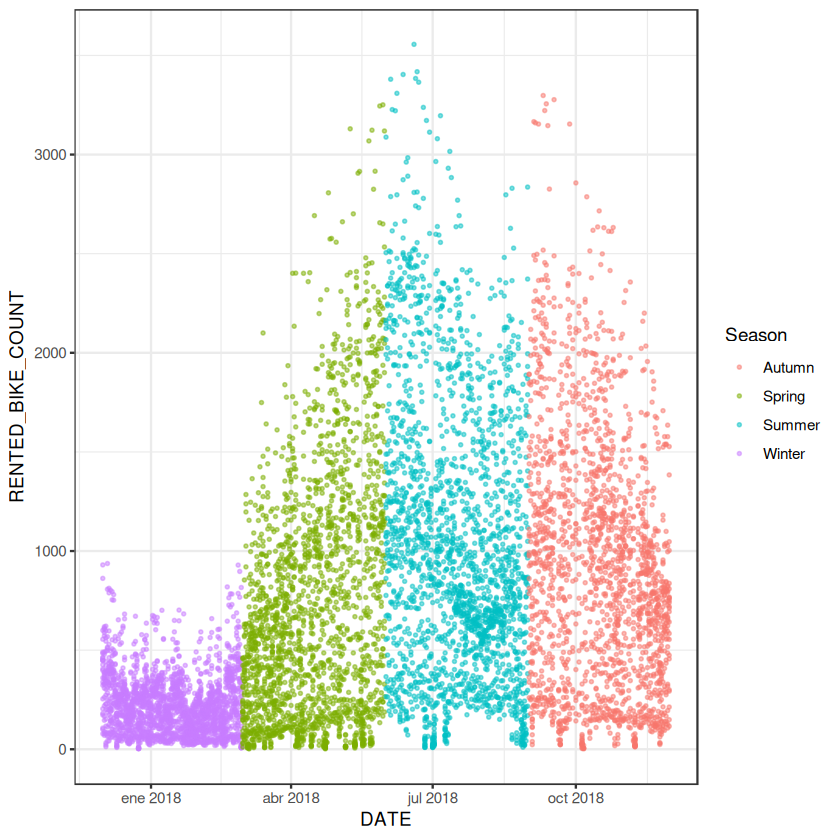

In [55]:
ggplot(seoul_bike_sharing, aes(x = DATE, y = RENTED_BIKE_COUNT)) +
  geom_point(aes(color = as.factor(SEASONS)), size = 0.5, alpha = 0.5) +
  labs(color = "Season") +
theme_bw()

In [56]:
plot <- ggplot(seoul_bike_sharing, aes(x = DATE, y = RENTED_BIKE_COUNT)) +
  geom_point(aes(color = as.factor(HOUR)), size = 0.5, alpha = 0.5) +
  scale_color_viridis_d(option = "plasma") +
  labs(color = "Hour") +
  guides(color = guide_legend(override.aes = list(size = 2))) +
  theme_bw()

ggplotly(plot)

HTML widgets cannot be represented in plain text (need html)

Warning message:
“The dot-dot notation (`..density..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(density)` instead.”


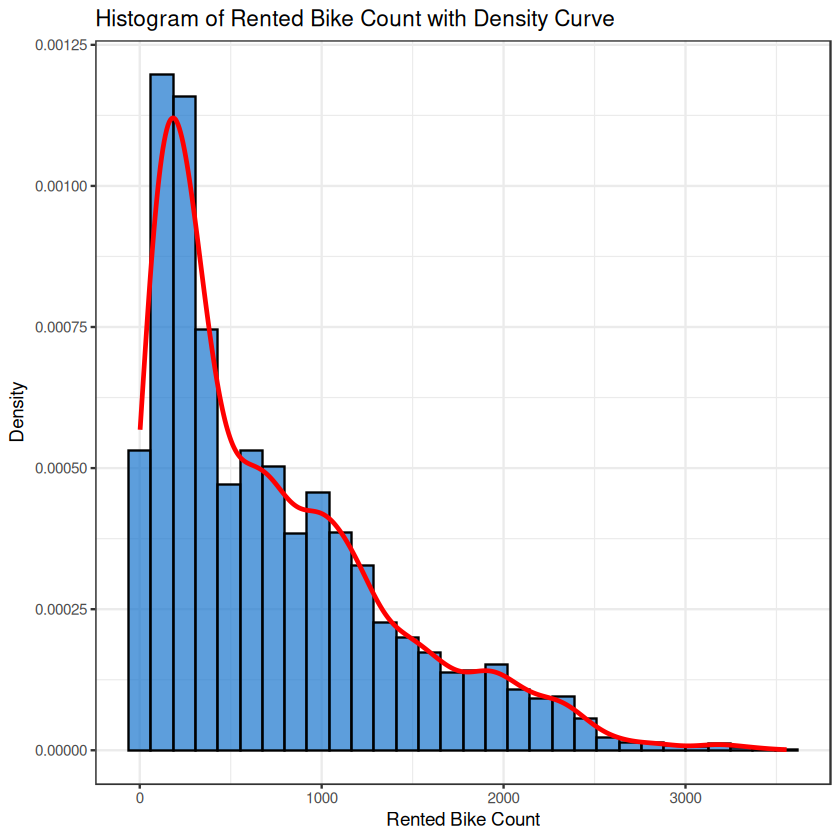

In [57]:
# Create a histogram overlaid with a kernel density curve
ggplot(seoul_bike_sharing, aes(x = RENTED_BIKE_COUNT)) +
  geom_histogram(aes(y = ..density..), bins = 30, fill = "dodgerblue3", color = "black", alpha = 0.7) +
  geom_density(color = "red", linewidth = 1) +
  labs(
    title = "Histogram of Rented Bike Count with Density Curve",
    x = "Rented Bike Count",
    y = "Density"
  ) +
  theme_bw()

In [58]:
# Use a scatter plot to visualize the correlation between
# RENTED_BIKE_COUNT and TEMPERATURE by SEASONS

plot <- ggplot(seoul_bike_sharing, aes(x = TEMPERATURE, y = RENTED_BIKE_COUNT)) +
  geom_point(aes(color = as.factor(HOUR)), size = 0.5, alpha = 0.5) +
  guides(color = guide_legend(override.aes = list(size = 2))) +
  facet_wrap(~SEASONS) +
  labs(color = "Hour") +
  theme_bw()

ggplotly(plot)

HTML widgets cannot be represented in plain text (need html)

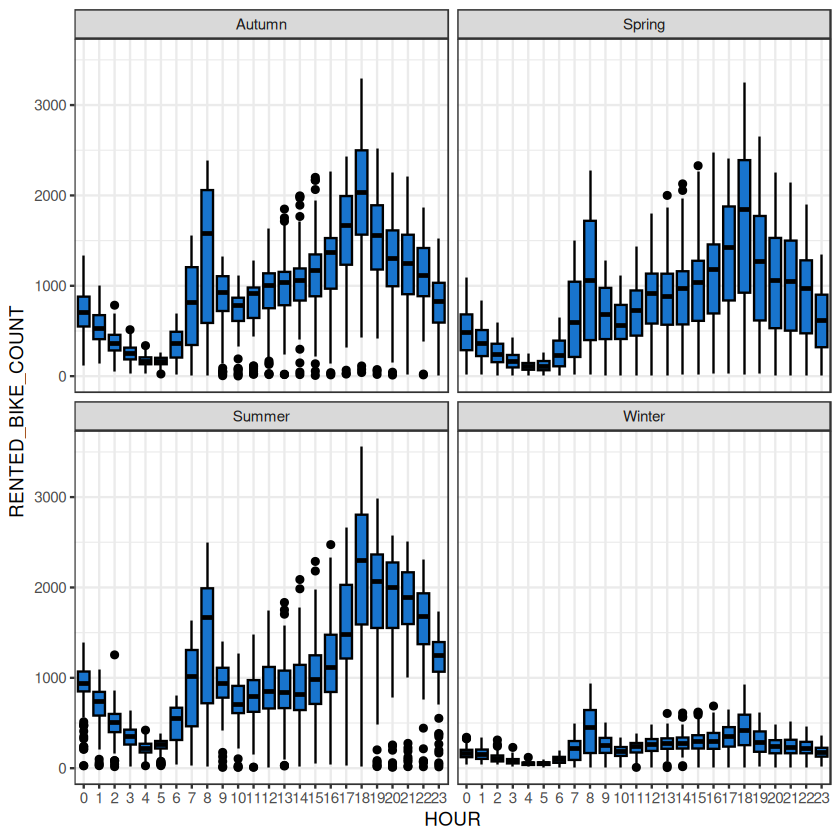

In [291]:
# boxplots of RENTED_BIKE_COUNT vs. HOUR grouped by SEASONS
ggplot(seoul_bike_sharing, aes(x = HOUR, y = RENTED_BIKE_COUNT)) +
  geom_boxplot(aes(fill = I("dodgerblue3"), color = I("black"))) +
  facet_wrap(~SEASONS) +
  theme_bw()

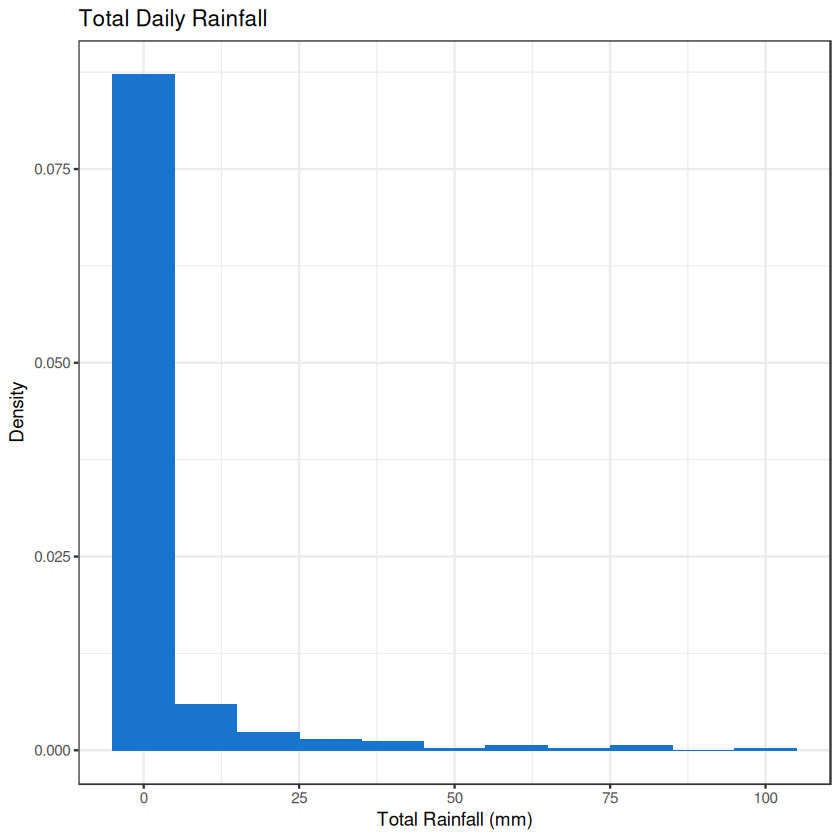

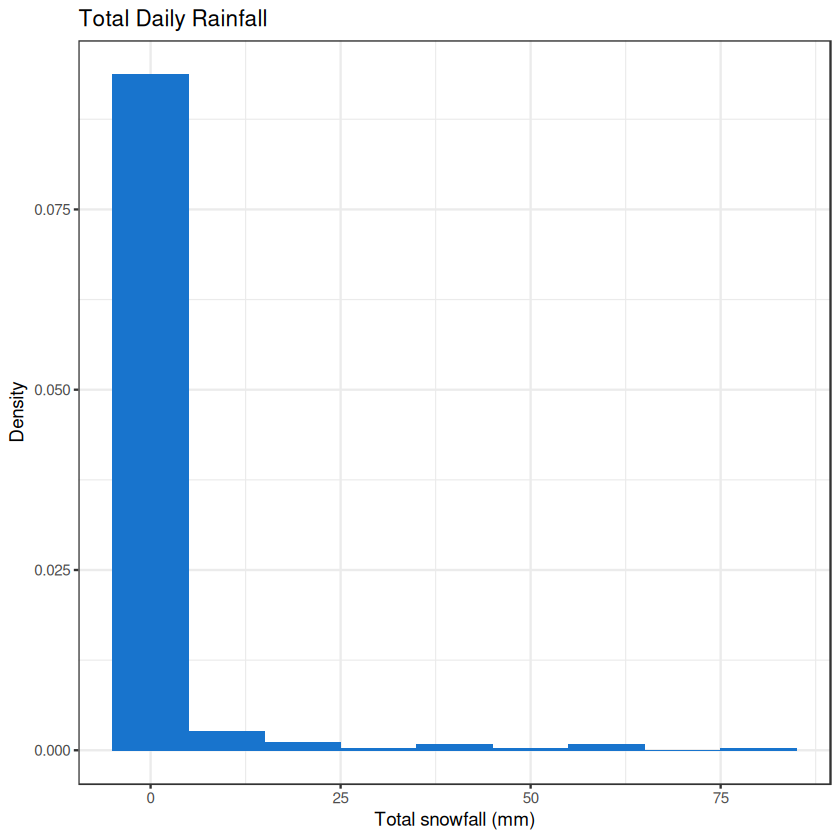

In [317]:
# Group the data by DATE, and use the summarize() function to calculate the daily total rainfall and snowfall.
total_daily_rainfall_snowfall <- seoul_bike_sharing |>
  group_by(DATE) |>
  summarize(
    TOTAL_RAINFALL = sum(RAINFALL, na.rm = TRUE),
    TOTAL_SNOWFALL = sum(SNOWFALL, na.rm = TRUE)
  )


ggplot(total_daily_rainfall_snowfall, aes(x = TOTAL_RAINFALL)) +
  geom_histogram(aes(y=..density..), fill = "dodgerblue3", bins = 30, binwidth = 10) +
  labs(
    title = "Total Daily Rainfall",
    x = "Total Rainfall (mm)",
    y = "Density"
  ) +
  theme_bw()

ggplot(total_daily_rainfall_snowfall, aes(x = TOTAL_SNOWFALL)) +
  geom_histogram(aes(y=..density..), fill = "dodgerblue3", bins = 30, binwidth = 10) +
  labs(
    title = "Total Daily Rainfall",
    x = "Total snowfall (mm)",
    y = "Density"
  ) +
  theme_bw()

In [295]:
total_day_with_snowfall <- total_daily_rainfall_snowfall |>
  filter(TOTAL_SNOWFALL > 0) |>
  tally() |>
  rename(COUNT_OF_DAYS_WITH_SNOWFALL = n)
total_day_with_snowfall

COUNT_OF_DAYS_WITH_SNOWFALL
<int>
27


# data modeling

In [2]:
bike_sharing_df <- read_csv("Data/Clean_seoul_bike_sharing_normalized.csv", show_col_types = FALSE) |>
  select(-HOUR, -DATE, -SEASONS)
head(bike_sharing_df)

RENTED_BIKE_COUNT,TEMPERATURE,HUMIDITY,WIND_SPEED,VISIBILITY,DEW_POINT_TEMPERATURE,SOLAR_RADIATION,RAINFALL,SNOWFALL,0,⋯,20,21,22,23,AUTUMN,SPRING,SUMMER,WINTER,HOLIDAY,NO_HOLIDAY
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
254,0.2202797,0.3775510,0.2972973,1,0.2249135,0,0,0,1,⋯,0,0,0,0,0,0,0,1,0,1
204,0.2150350,0.3877551,0.1081081,1,0.2249135,0,0,0,0,⋯,0,0,0,0,0,0,0,1,0,1
173,0.2062937,0.3979592,0.1351351,1,0.2231834,0,0,0,0,⋯,0,0,0,0,0,0,0,1,0,1
107,0.2027972,0.4081633,0.1216216,1,0.2249135,0,0,0,0,⋯,0,0,0,0,0,0,0,1,0,1
78,0.2062937,0.3673469,0.3108108,1,0.2076125,0,0,0,0,⋯,0,0,0,0,0,0,0,1,0,1
100,0.1993007,0.3775510,0.2027027,1,0.2058824,0,0,0,0,⋯,0,0,0,0,0,0,0,1,0,1


In [3]:
# Split data
set.seed(1234)
bike_split <- initial_split(bike_sharing_df, prop = 4 / 5)
bike_train <- training(bike_split)
bike_test <- testing(bike_split)

## Regression 1: Multiple simple linear regression with only climatic variables

[1] "Training set performance:"


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,484.6519


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rsq,standard,0.4347041


[1] "Testing set performance:"


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,472.8513


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rsq,standard,0.4422162


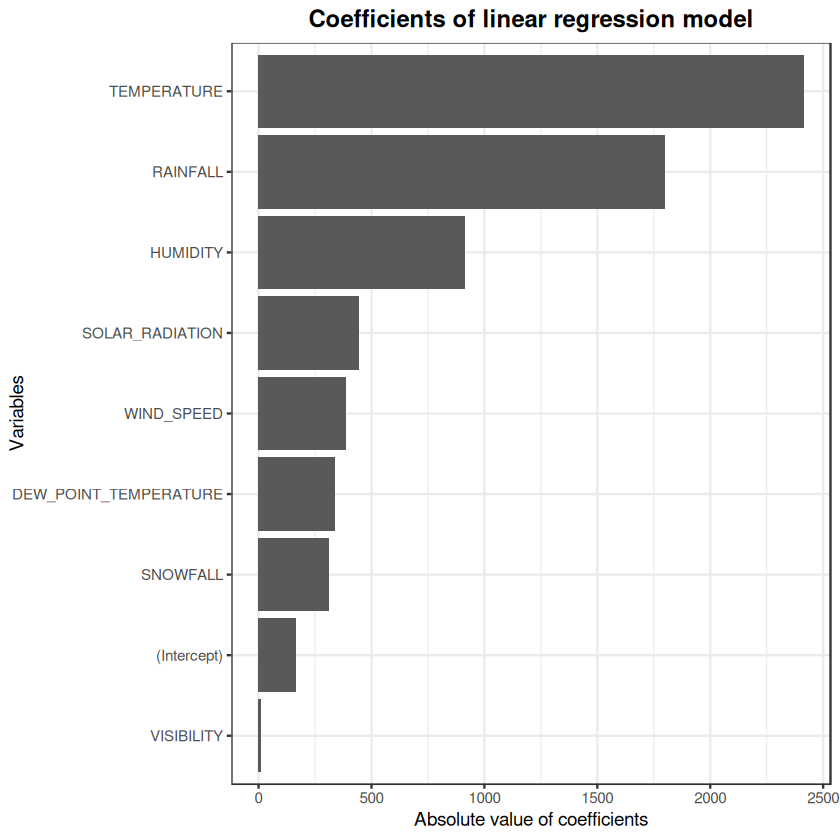

In [4]:
# define linear regression
lm_model1 <- linear_reg() |>
  set_engine("lm") |>
  set_mode("regression")

# define recipe
lm_model1_recipe_weather <- recipe(
  RENTED_BIKE_COUNT ~ TEMPERATURE + HUMIDITY + WIND_SPEED + VISIBILITY + DEW_POINT_TEMPERATURE +
    SOLAR_RADIATION + RAINFALL + SNOWFALL,
  data = bike_train
)


# define workflow
lm_model1_weather_workflow <- workflow() |>
  add_model(lm_model1) |>
  add_recipe(lm_model1_recipe_weather)

# fit the model
lm_model1_weather_fit <- lm_model1_weather_workflow |>
  fit(data = bike_train)

# visualization coefficents
lm_model1_weather_fit |>
  extract_fit_parsnip() |>
  tidy() |>
  select(term, estimate) |>
  drop_na(estimate) |>
  ggplot(aes(y = reorder(term, abs(estimate)), x = abs(estimate))) +
  geom_bar(stat = "identity") +
  labs(
    title = "Coefficients of linear regression model",
    x = "Absolute value of coefficients",
    y = "Variables"
  ) +
  theme_bw() +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold", size = 14)
  )

# Evaluate the model
lm_model1_train_predictions <- lm_model1_weather_fit |>
  predict(new_data = bike_train) |>
  bind_cols(bike_train) |>
  mutate(.pred = if_else(.pred < 0, 0, .pred))

lm_model1_rmse_train <- lm_model1_train_predictions |>
  rmse(truth = RENTED_BIKE_COUNT, estimate = .pred)

lm_model1_rsq_train <- lm_model1_train_predictions |>
  rsq(truth = RENTED_BIKE_COUNT, estimate = .pred)

print("Training set performance:")
lm_model1_rmse_train; lm_model1_rsq_train

lm_model1_test_predictions <- lm_model1_weather_fit |>
  predict(new_data = bike_test) |>
  bind_cols(bike_test) |>
  mutate(.pred = if_else(.pred < 0, 0, .pred))

lm_model1_rmse_test <- lm_model1_test_predictions |>
  rmse(truth = RENTED_BIKE_COUNT, estimate = .pred)

lm_model1_rsq_test <- lm_model1_test_predictions |>
  rsq(truth = RENTED_BIKE_COUNT, estimate = .pred)

print("Testing set performance:")
lm_model1_rmse_test; lm_model1_rsq_test

## Regression 2: Multiple simple linear regression with all variables

Warning message in predict.lm(object = object$fit, newdata = new_data, type = "response", :
“prediction from rank-deficient fit; consider predict(., rankdeficient="NA")”


[1] "Training set performance:"


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,366.2432


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rsq,standard,0.6809562


Warning message in predict.lm(object = object$fit, newdata = new_data, type = "response", :
“prediction from rank-deficient fit; consider predict(., rankdeficient="NA")”


[1] "Testing set performance:"


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,354.7802


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rsq,standard,0.6899489


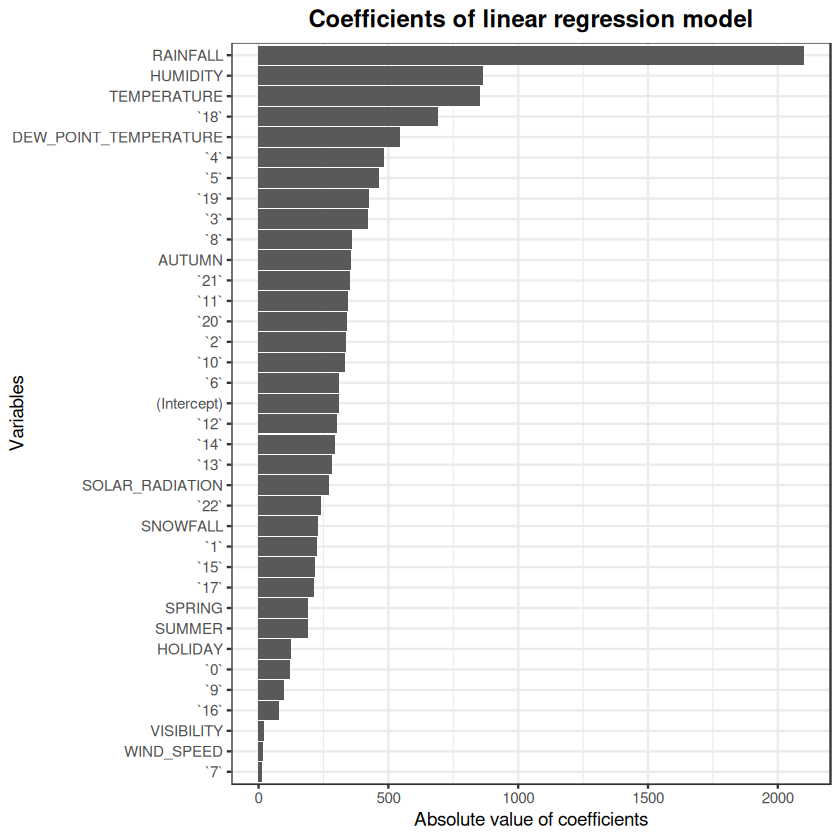

In [5]:
# define linear regression
lm_model2_all_variables <- linear_reg() |>
  set_engine("lm") |>
  set_mode("regression")

# define recipe
lm_model2_recipe_all_variables <- recipe(
  RENTED_BIKE_COUNT ~ .,
  data = bike_train)


# define workflow
lm_model2_all_variables_workflow <- workflow() |>
  add_model(lm_model2_all_variables) |>
  add_recipe(lm_model2_recipe_all_variables) |>
  step_nzv(all_predictors())  # Se puede usar step_nzv para eliminar variables con poca varianza

# fit the model
lm_model2_all_variables_fit <- lm_model2_all_variables_workflow |>
  fit(data = bike_train)

# visualization coefficents
lm_model2_all_variables_fit |>
  extract_fit_parsnip() |>
  tidy() |>
  select(term, estimate) |>
  drop_na(estimate) |>
  ggplot(aes(y = reorder(term, abs(estimate)), x = abs(estimate))) +
  geom_bar(stat = "identity") +
  labs(
    title = "Coefficients of linear regression model",
    x = "Absolute value of coefficients",
    y = "Variables"
  ) +
  theme_bw() +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold", size = 14)
  )


# Evaluate the model
lm_model2_train_predictions <- lm_model2_all_variables_fit|>
  predict(new_data = bike_train) |>
  bind_cols(bike_train) |>
  mutate(.pred = if_else(.pred < 0, 0, .pred))

lm_model2_rmse_train <- lm_model2_train_predictions |>
  rmse(truth = RENTED_BIKE_COUNT, estimate = .pred)

lm_model2_rsq_train <- lm_model2_train_predictions |>
  rsq(truth = RENTED_BIKE_COUNT, estimate = .pred)

print("Training set performance:")
lm_model2_rmse_train; lm_model2_rsq_train


lm_model2_test_predictions <- lm_model2_all_variables_fit |>
  predict(new_data = bike_test) |>
  bind_cols(bike_test) |>
  mutate(.pred = if_else(.pred < 0, 0, .pred))

lm_model2_rmse_test <- lm_model2_test_predictions |>
  rmse(truth = RENTED_BIKE_COUNT, estimate = .pred)

lm_model2_rsq_test <- lm_model2_test_predictions |>
  rsq(truth = RENTED_BIKE_COUNT, estimate = .pred)

print("Testing set performance:")
lm_model2_rmse_test; lm_model2_rsq_test

## Regression 3: Multiple Polynomial Linear Regression

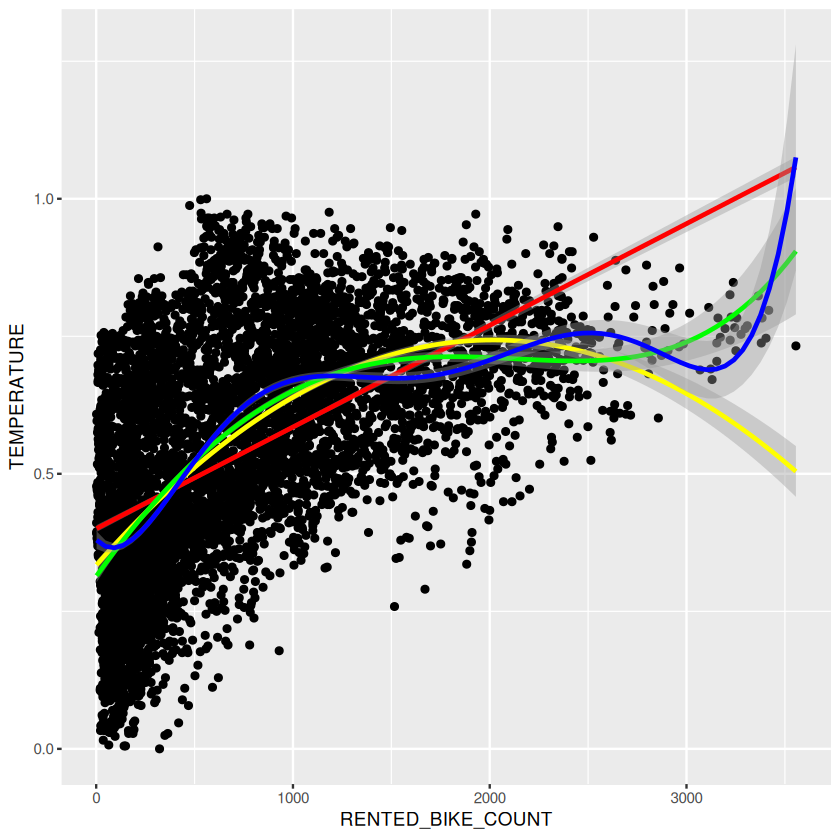

In [6]:
#is it linear the correlation between RENTED_BIKE_COUNT and TEMPERATURE?

ggplot(data=bike_train, aes(RENTED_BIKE_COUNT, TEMPERATURE)) + 
  geom_point() + 
  geom_smooth(method = "lm", formula = y ~ x, color="red") + 
  geom_smooth(method = "lm", formula = y ~ poly(x, 2), color="yellow") + 
  geom_smooth(method = "lm", formula = y ~ poly(x, 4), color="green") + 
  geom_smooth(method = "lm", formula = y ~ poly(x, 6), color="blue")

#it's not linear, so we will use polynomial regression

[1] "Training set performance:"


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,423.0488


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rsq,standard,0.5706623


[1] "Testing set performance:"


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,413.7769


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rsq,standard,0.57493


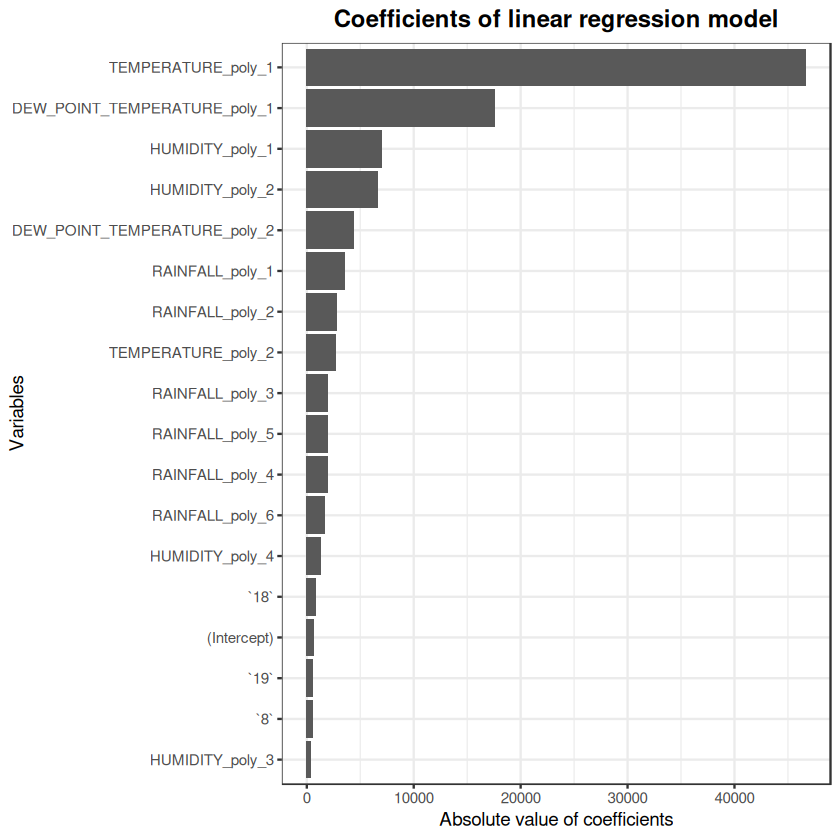

In [7]:
# define linear regression
lm_model3_poly_weather <- linear_reg() |>
  set_engine("lm") |>
  set_mode("regression")

# define recipe
lm_model3_poly_weather_recipe <- recipe(
  RENTED_BIKE_COUNT ~ RAINFALL + HUMIDITY + TEMPERATURE + `18` + DEW_POINT_TEMPERATURE + `19` + `8`,
  data = bike_train
) |>
  step_poly(RAINFALL, degree = 6, options = list(raw = FALSE)) |>
  step_poly(HUMIDITY, degree = 4, options = list(raw = FALSE)) |>
  step_poly(TEMPERATURE, DEW_POINT_TEMPERATURE, degree = 2, options = list(raw = FALSE))

# define workflow
lm_model3_poly_weather_workflow <- workflow() |>
  add_model(lm_model3_poly_weather) |>
  add_recipe(lm_model3_poly_weather_recipe)

lm_model3_poly_weather_fit <- lm_model3_poly_weather_workflow |>
  fit(data = bike_train)

# visualization coefficents
lm_model3_poly_weather_fit |>
  extract_fit_parsnip() |>
  tidy() |>
  select(term, estimate) |>
  drop_na(estimate) |>
  ggplot(aes(y = reorder(term, abs(estimate)), x = abs(estimate))) +
  geom_bar(stat = "identity") +
  labs(
    title = "Coefficients of linear regression model",
    x = "Absolute value of coefficients",
    y = "Variables"
  ) +
  theme_bw() +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold", size = 14)
  )

lm_model3_poly_weather_train_predictions <- lm_model3_poly_weather_fit |>
  predict(new_data = bike_train) |>
  bind_cols(bike_train) |>
  mutate(.pred = if_else(.pred < 0, 0, .pred))

lm_model3_poly_weather_rmse_train <- lm_model3_poly_weather_train_predictions |>
  rmse(truth = RENTED_BIKE_COUNT, estimate = .pred)

lm_model3_poly_weather_rsq_train <- lm_model3_poly_weather_train_predictions |>
  rsq(truth = RENTED_BIKE_COUNT, estimate = .pred)

print("Training set performance:")
lm_model3_poly_weather_rmse_train; lm_model3_poly_weather_rsq_train

lm_model3_poly_weather_test_predictions <- lm_model3_poly_weather_fit |>
  predict(new_data = bike_test) |>
  bind_cols(bike_test) |>
  mutate(.pred = if_else(.pred < 0, 0, .pred))

lm_model3_poly_weather_rmse_test <- lm_model3_poly_weather_test_predictions |>
  rmse(truth = RENTED_BIKE_COUNT, estimate = .pred)

lm_model3_poly_weather_rsq_test <- lm_model3_poly_weather_test_predictions |>
  rsq(truth = RENTED_BIKE_COUNT, estimate = .pred)


print("Testing set performance:")
lm_model3_poly_weather_rmse_test; lm_model3_poly_weather_rsq_test


## Regression 4: Multiple Polynomial Linear Regression interaction terms for the recipe

[1] "Training set performance:"


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,422.8016


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rsq,standard,0.5710112


[1] "Testing set performance:"


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,414.8946


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rsq,standard,0.5722223


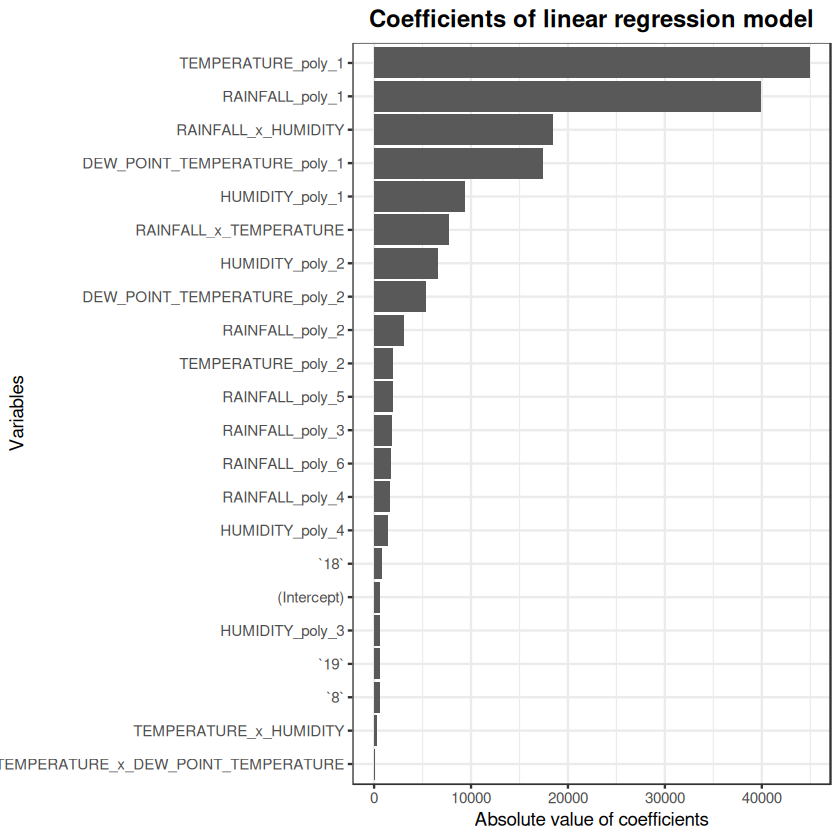

In [27]:
# define linear regression
lm_model4_poly_weather_with_interaction <- linear_reg() |>
  set_engine("lm") |>
  set_mode("regression")

# define recipe
lm_model4_poly_weather_with_interaction_recipe <- recipe(
  RENTED_BIKE_COUNT ~ RAINFALL + HUMIDITY + TEMPERATURE + `18` +DEW_POINT_TEMPERATURE + `19`+ `8`, data = bike_train) |>
  step_interact(terms = ~ RAINFALL:TEMPERATURE + RAINFALL:HUMIDITY + TEMPERATURE:HUMIDITY +
                          DEW_POINT_TEMPERATURE:TEMPERATURE) |>
  step_poly(RAINFALL, degree = 6, options = list(raw = FALSE)) |>
  step_poly(HUMIDITY, degree = 4, options = list(raw = FALSE)) |>
  step_poly(TEMPERATURE, DEW_POINT_TEMPERATURE, degree = 2, options = list(raw = FALSE))

# create workflow and add recipe and model
lm_model4_poly_weather_with_interaction_workflow <- workflow() |>
  add_recipe(lm_model4_poly_weather_with_interaction_recipe) |>
  add_model(lm_model4_poly_weather_with_interaction)

# Fit the model to the train data
lm_model4_poly_weather_with_interaction_fit <- lm_model4_poly_weather_with_interaction_workflow |>
  fit(data = bike_train)

# visualization coefficents
lm_model4_poly_weather_with_interaction_fit |>
  extract_fit_parsnip() |>
  tidy() |>
  select(term, estimate) |>
  drop_na(estimate) |>
  ggplot(aes(y = reorder(term, abs(estimate)), x = abs(estimate))) +
  geom_bar(stat = "identity") +
  labs(
    title = "Coefficients of linear regression model",
    x = "Absolute value of coefficients",
    y = "Variables"
  ) +
  theme_bw() +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold", size = 14)
  )

lm_model4_poly_weather_with_interaction_train_predictions <- lm_model4_poly_weather_with_interaction_fit |>
  predict(new_data = bike_train) |>
  bind_cols(bike_train) |>
  mutate(.pred = if_else(.pred < 0, 0, .pred))

lm_model4_poly_weather_with_interaction_rmse_train <- lm_model4_poly_weather_with_interaction_train_predictions |>
  rmse(truth = RENTED_BIKE_COUNT, estimate = .pred)

lm_model4_poly_weather_with_interaction_rsq_train <- lm_model4_poly_weather_with_interaction_train_predictions |>
  rsq(truth = RENTED_BIKE_COUNT, estimate = .pred)

print("Training set performance:")
lm_model4_poly_weather_with_interaction_rmse_train; lm_model4_poly_weather_with_interaction_rsq_train

lm_model4_poly_weather_with_interaction_test_predictions <- lm_model4_poly_weather_with_interaction_fit |>
  predict(new_data = bike_test) |>
  bind_cols(bike_test) |>
  mutate(.pred = if_else(.pred < 0, 0, .pred))

lm_model4_poly_weather_with_interaction_rmse_test <- lm_model4_poly_weather_test_predictions |>
  rmse(truth = RENTED_BIKE_COUNT, estimate = .pred)

lm_model4_poly_weather_with_interaction_rsq_test <- lm_model4_poly_weather_test_predictions |>
  rsq(truth = RENTED_BIKE_COUNT, estimate = .pred)


print("Testing set performance:")
lm_model4_poly_weather_with_interaction_rmse_test; lm_model4_poly_weather_with_interaction_rsq_test

## Regression 5: Linear regression with lasso regularization (L1) and kfolds cross-validation

[1] "Tuning results for lasso regression:"


penalty,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1.865963e-01,rsq,standard,0.7176773,10,0.004786654,Preprocessor1_Model251
1.761243e-01,rsq,standard,0.7176770,10,0.004786554,Preprocessor1_Model250
1.000000e-07,rsq,standard,0.7176770,10,0.004786548,Preprocessor1_Model001
1.059458e-07,rsq,standard,0.7176770,10,0.004786548,Preprocessor1_Model002
1.122451e-07,rsq,standard,0.7176770,10,0.004786548,Preprocessor1_Model003


[1] "Training set performance:"


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,329.6574


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rsq,standard,0.7417973


[1] "Testing set performance:"


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,327.3602


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rsq,standard,0.7354427


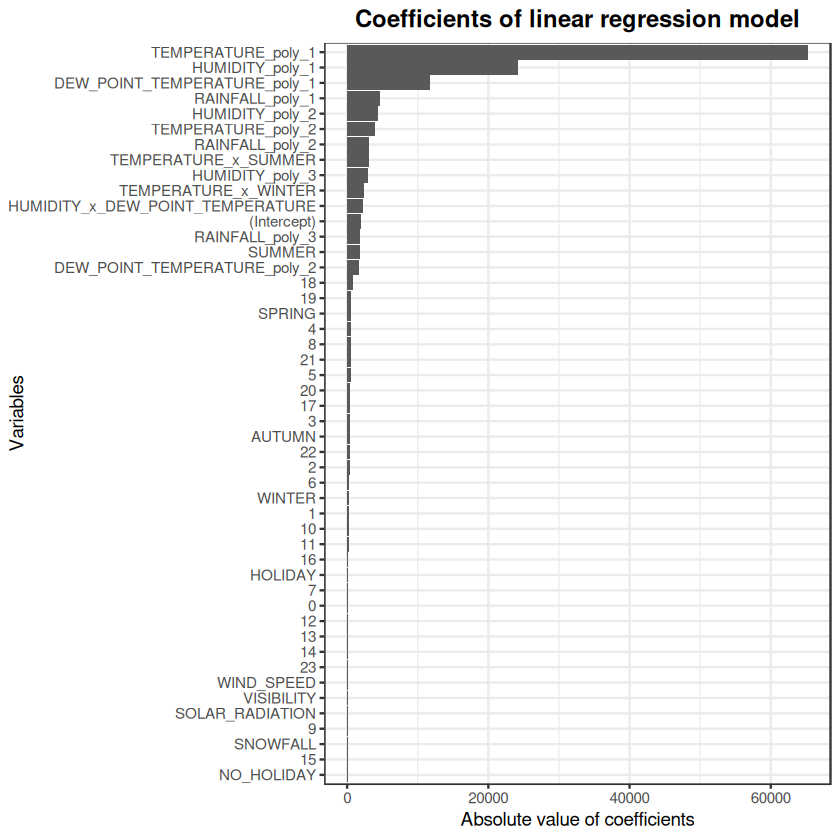

In [9]:
# add regularization to the model
lm_model5_lasso <-
  linear_reg(penalty = tune(), mixture = 1) |>
  set_engine("glmnet")

# Create a recipe for lasso regression
lm_model5_lasso_recipe <- recipe(RENTED_BIKE_COUNT ~ ., data = bike_train) |>
  step_interact(terms = ~ TEMPERATURE:SUMMER + TEMPERATURE:WINTER + HUMIDITY:DEW_POINT_TEMPERATURE) |>
  step_poly(RAINFALL, HUMIDITY, degree = 3, options = list(raw = FALSE)) |>
  step_poly(TEMPERATURE, DEW_POINT_TEMPERATURE, degree = 2, options = list(raw = FALSE))

# Create a workflow for lasso regression
lm_model5_lasso_workflow <-
  workflow() |>
  add_recipe(lm_model5_lasso_recipe) |>
  add_model(lm_model5_lasso)

# perform cross-validation to find the best penalty
lambda_grid <- grid_regular(levels = 300, penalty(range = c(-7,0.5)))
lasso_cv_folds <- vfold_cv(bike_train, v = 10)

# Tune the lasso model using cross-validation
lm_model5_lasso_tune_results <- 
  tune_grid(
  lm_model5_lasso_workflow,
  resamples = lasso_cv_folds,
  grid = lambda_grid,
  metrics = metric_set(rmse, rsq, mae),
  control = control_grid(save_pred = TRUE)
)

# Show and select the best results
print("Tuning results for lasso regression:")
show_best(lm_model5_lasso_tune_results, metric = "rsq")
best_lasso_penalty <- select_best(lm_model5_lasso_tune_results, metric = "rsq")

# Finalize the lasso workflow with the best penalty
final_lm_model5_lasso_workflow <-
  lm_model5_lasso_workflow |>
  finalize_workflow(best_lasso_penalty)

# Fit the final lasso model to the training data
lm_model5_lasso_final_fit <-
  final_lm_model5_lasso_workflow |>
  fit(data = bike_train)

# visualization coefficents
lm_model5_lasso_final_fit |>
  extract_fit_parsnip() |>
  tidy() |>
  select(term, estimate) |>
  drop_na(estimate) |>
  ggplot(aes(y = reorder(term, abs(estimate)), x = abs(estimate))) +
  geom_bar(stat = "identity") +
  labs(
    title = "Coefficients of linear regression model",
    x = "Absolute value of coefficients",
    y = "Variables"
  ) +
  theme_bw() +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold", size = 14)
  )

# Evaluate the lasso model on the training set
lm_model5_lasso_train_predictions <- lm_model5_lasso_final_fit |>
  predict(new_data = bike_train) |>
  bind_cols(bike_train) |>
  mutate(.pred = if_else(.pred < 0, 0, .pred))

lm_model5_lasso_rmse_train <- lm_model5_lasso_train_predictions |>
  rmse(truth = RENTED_BIKE_COUNT, estimate = .pred)

lm_model5_lasso_rsq_train <- lm_model5_lasso_train_predictions |>
  rsq(truth = RENTED_BIKE_COUNT, estimate = .pred)

print("Training set performance:")
lm_model5_lasso_rmse_train; lm_model5_lasso_rsq_train

# Evaluate the lasso model on the test set
lm_model5_lasso_test_predictions <- lm_model5_lasso_final_fit |>
  predict(new_data = bike_test) |>
  bind_cols(bike_test) |>
  mutate(.pred = if_else(.pred < 0, 0, .pred))

lm_model5_lasso_rmse_test <- lm_model5_lasso_test_predictions |>
  rmse(truth = RENTED_BIKE_COUNT, estimate = .pred)

lm_model5_lasso_rsq_test <- lm_model5_lasso_test_predictions |>
  rsq(truth = RENTED_BIKE_COUNT, estimate = .pred)

print("Testing set performance:")
lm_model5_lasso_rmse_test; lm_model5_lasso_rsq_test

## Regression 6: Poisson regression with lasso regularization

[1] "Tuning results for lasso regression:"


penalty,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
3.162278,rsq,standard,0.7892755,10,0.009394293,Preprocessor1_Model300
2.984808,rsq,standard,0.5826866,10,0.019672307,Preprocessor1_Model299
2.817298,rsq,standard,0.5822545,10,0.019781824,Preprocessor1_Model298
2.659189,rsq,standard,0.5818451,10,0.019885275,Preprocessor1_Model297
2.509953,rsq,standard,0.5814587,10,0.019983170,Preprocessor1_Model296


[1] "Training set performance:"


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,300.6946


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rsq,standard,0.7826824


[1] "Testing set performance:"


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rmse,standard,284.443


.metric,.estimator,.estimate
<chr>,<chr>,<dbl>
rsq,standard,0.7988767


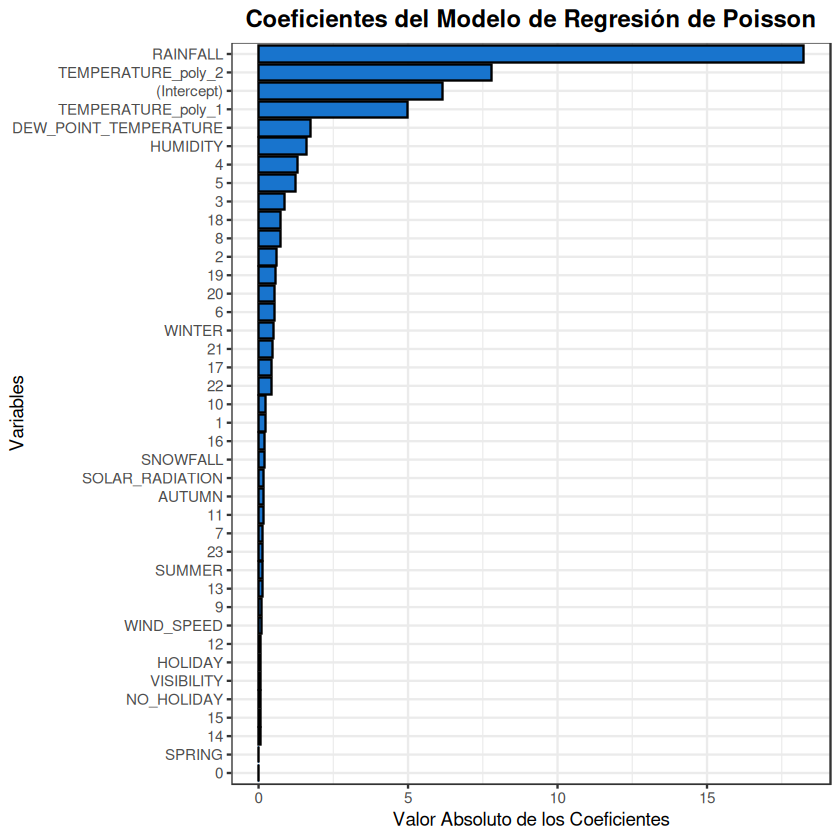

In [19]:
lm6_poisson_spec <-
  poisson_reg(penalty = tune(), mixture = 0.5) |> # mixture = 1 para Lasso
  set_engine("glmnet")

# Create a recipe for Poisson regression
# Mantenemos las interacciones y términos polinomiales que ya definiste
lm6_poisson_recipe <- recipe(RENTED_BIKE_COUNT ~ ., data = bike_test) |>
  step_dummy(all_nominal_predictors()) |>
  step_poly(TEMPERATURE, degree = 2, options = list(raw = FALSE)) 

# Create a workflow for Poisson regression
lm6_poisson_workflow <-
  workflow() |>
  add_recipe(lm6_poisson_recipe) |>
  add_model(lm6_poisson_spec)

# perform cross-validation to find the best penalty
lambda_grid <- grid_regular(levels = 300, penalty(range = c(-7, 0.5))) # Rango de penalización
poisson_cv_folds <- vfold_cv(bike_test, v = 10) # Sin estratificación, como solicitaste

# Tune the Poisson model using cross-validation
lm6_poisson_tune_results <-
  tune_grid(
    lm6_poisson_workflow,
    resamples = poisson_cv_folds,
    grid = lambda_grid,
    metrics = metric_set(rmse, rsq, mae),
    control = control_grid(save_pred = TRUE)
  )

# Show and select the best results
print("Tuning results for lasso regression:")
show_best(lm6_poisson_tune_results, metric = "rsq")
best_poisson_penalty <- select_best(lm6_poisson_tune_results, metric = "rsq")

lm6_poisson_workflow_final <-
  lm6_poisson_workflow |>
  finalize_workflow(best_poisson_penalty)

lm6_poisson_fit <-
  lm6_poisson_workflow_final |>
  fit(data = bike_test)

# Visualización de Coeficientes (para entender la importancia de las variables)
# Nota: Los coeficientes de Poisson son en la escala logarítmica de la media.
lm6_poisson_fit |>
  extract_fit_parsnip() |>
  tidy() |>
  select(term, estimate) |>
  drop_na(estimate) |>
  ggplot(aes(y = reorder(term, abs(estimate)), x = abs(estimate))) +
  geom_bar(stat = "identity", aes(color = I("black"), fill = I("dodgerblue3"))) +
  labs(
    title = "Coeficientes del Modelo de Regresión de Poisson",
    x = "Valor Absoluto de los Coeficientes",
    y = "Variables"
  ) +
  theme_bw() +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold", size = 14)
  )

# --- Evaluación del rendimiento con los datos de entrenamiento y prueba ---

# Las predicciones de Poisson son por defecto positivas, no necesitas if_else(.pred < 0, 0, .pred)
# Pero es una buena práctica asegurar que no haya ceros si la variable objetivo puede ser 0
# y si glmnet produce ceros (aunque con poisson_reg es menos probable).
# Sin embargo, dado que la cuenta de bicicletas no puede ser negativa, el clipping a 0 es seguro.

lm6_poisson_train_predictions <-
  lm6_poisson_fit |>
  predict(new_data = bike_train) |>
  bind_cols(bike_train) |>
  mutate(.pred = if_else(.pred < 0, 0, .pred)) # Clipping a 0 por seguridad

lm6_poisson_rmse_bike_train <- lm6_poisson_train_predictions |>
  rmse(truth = RENTED_BIKE_COUNT, estimate = .pred)

lm6_poisson_rsq_bike_train <- lm6_poisson_train_predictions |>
  rsq(truth = RENTED_BIKE_COUNT, estimate = .pred)

print("Training set performance:")
lm6_poisson_rmse_bike_train; lm6_poisson_rsq_bike_train

lm6_poisson_test_predictions <-
  lm6_poisson_fit |>
  predict(new_data = bike_test) |>
  bind_cols(bike_test) |>
  mutate(.pred = if_else(.pred < 0, 0, .pred)) # Clipping a 0 por seguridad

lm6_poisson_rmse_bike_test <- lm6_poisson_test_predictions |>
  rmse(truth = RENTED_BIKE_COUNT, estimate = .pred)

lm6_poisson_rsq_bike_test <- lm6_poisson_test_predictions |>
  rsq(truth = RENTED_BIKE_COUNT, estimate = .pred)

print("Testing set performance:")
lm6_poisson_rmse_bike_test; lm6_poisson_rsq_bike_test

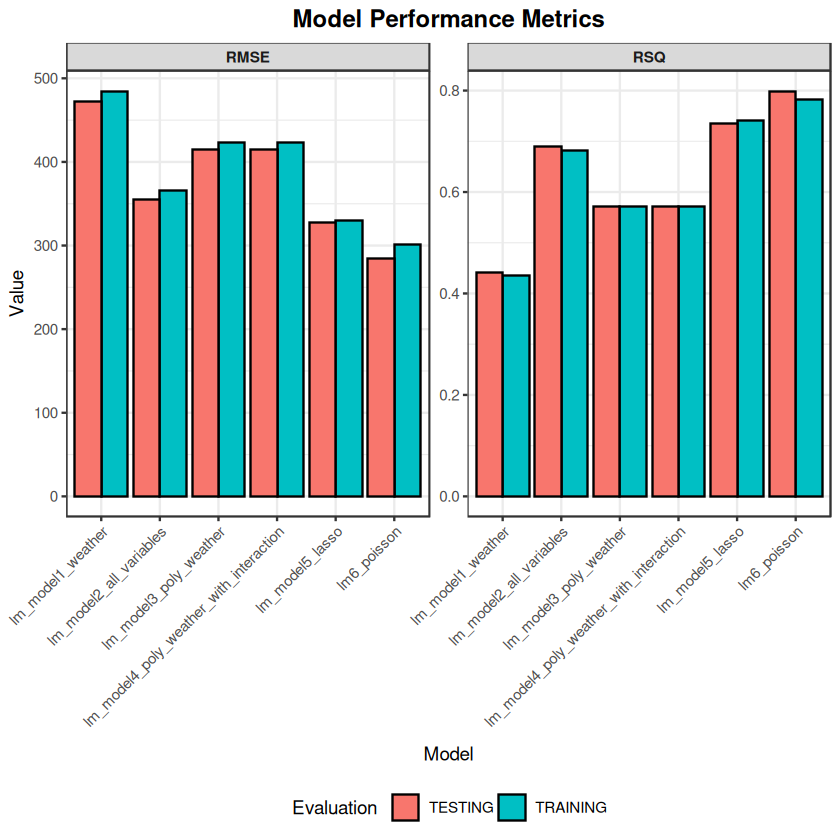

In [32]:
df_metrics <- tibble(
  MODEL = rep(c("lm_model1_weather", "lm_model2_all_variables", "lm_model3_poly_weather",
                "lm_model4_poly_weather_with_interaction", "lm_model5_lasso", "lm6_poisson"), each = 2),
  EVALUATION = rep(c("TRAINING", "TESTING"), times = 6),
  RMSE = c(lm_model1_rmse_train$.estimate, lm_model1_rmse_test$.estimate,
           lm_model2_rmse_train$.estimate, lm_model2_rmse_test$.estimate,
           lm_model3_poly_weather_rmse_train$.estimate, lm_model3_poly_weather_rmse_test$.estimate,
           lm_model4_poly_weather_with_interaction_rmse_train$.estimate, lm_model4_poly_weather_with_interaction_rmse_test$.estimate,
           lm_model5_lasso_rmse_train$.estimate, lm_model5_lasso_rmse_test$.estimate,
           lm6_poisson_rmse_bike_train$.estimate, lm6_poisson_rmse_bike_test$.estimate),
  RSQ = c(lm_model1_rsq_train$.estimate, lm_model1_rsq_test$.estimate,
                lm_model2_rsq_train$.estimate, lm_model2_rsq_test$.estimate,
                lm_model3_poly_weather_rsq_train$.estimate, lm_model3_poly_weather_rsq_test$.estimate,
                lm_model4_poly_weather_with_interaction_rsq_train$.estimate, lm_model4_poly_weather_with_interaction_rsq_test$.estimate,
                lm_model5_lasso_rsq_train$.estimate, lm_model5_lasso_rsq_test$.estimate,
                lm6_poisson_rsq_bike_train$.estimate, lm6_poisson_rsq_bike_test$.estimate) 
) |>
  pivot_longer(
    cols = c(RSQ, RMSE),
    names_to = "METRIC",
    values_to = "VALUE"
  )

df_metrics |>
  ggplot(aes(x = MODEL, y = VALUE)) +
  geom_bar(stat = "identity", aes(fill = EVALUATION), position = "dodge", color = I("black")) +
  facet_wrap(~ METRIC, scales = "free_y") +
  labs(
    title = "Model Performance Metrics",
    x = "Model",
    y = "Value",
    fill = "Evaluation"
  ) +
  theme_bw() +
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1),
    strip.text = element_text(face = "bold"),
    legend.position = "bottom",
    plot.title = element_text(hjust = 0.5, face = "bold", size = 14)
  )

# Poisson regression is the better model!

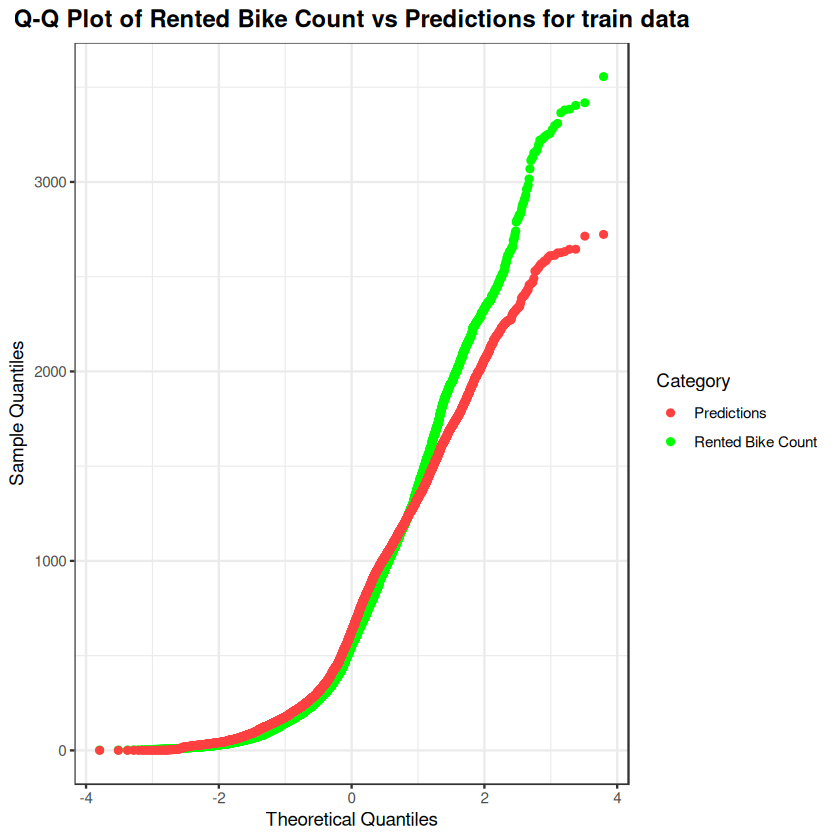

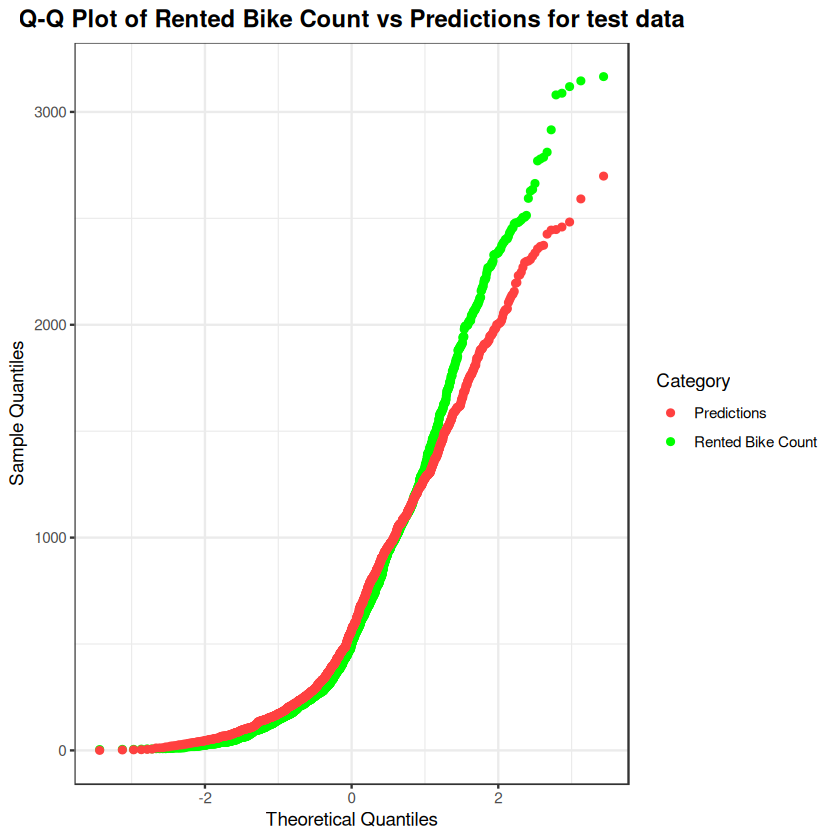

In [39]:
# Q-Q Plot for the training data for the best model
ggplot(lm6_poisson_train_predictions) +
  stat_qq(aes(sample = RENTED_BIKE_COUNT, color = "Rented Bike Count")) +
  stat_qq(aes(sample = .pred, color = "Predictions")) +
  labs(
    title = "Q-Q Plot of Rented Bike Count vs Predictions for train data",
    x = "Theoretical Quantiles",
    y = "Sample Quantiles",
    color = "Category" # Customize the legend title here
  ) +
  scale_color_manual(values = c("Rented Bike Count" = "green", "Predictions" = "brown1")) +
  theme_bw() +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold", size = 14)
  )

# Q-Q Plot for the test data for the best model
ggplot(lm6_poisson_test_predictions) +
  stat_qq(aes(sample = RENTED_BIKE_COUNT, color = "Rented Bike Count")) +
  stat_qq(aes(sample = .pred, color = "Predictions")) +
  labs(
    title = "Q-Q Plot of Rented Bike Count vs Predictions for test data",
    x = "Theoretical Quantiles",
    y = "Sample Quantiles",
    color = "Category" # Customize the legend title here
  ) +
  scale_color_manual(values = c("Rented Bike Count" = "green", "Predictions" = "brown1")) +
  theme_bw() +
  theme(
    plot.title = element_text(hjust = 0.5, face = "bold", size = 14)
  )

### Verifications of the assumptions of linear regression

In [ ]:
# Calculated the residuals for the best model
lm6_poisson_train_predictions <- lm6_poisson_train_predictions |>
  mutate(residuals = RENTED_BIKE_COUNT - .pred)
lm6_poisson_test_predictions <- lm6_poisson_test_predictions |>
  mutate(residuals = RENTED_BIKE_COUNT - .pred)

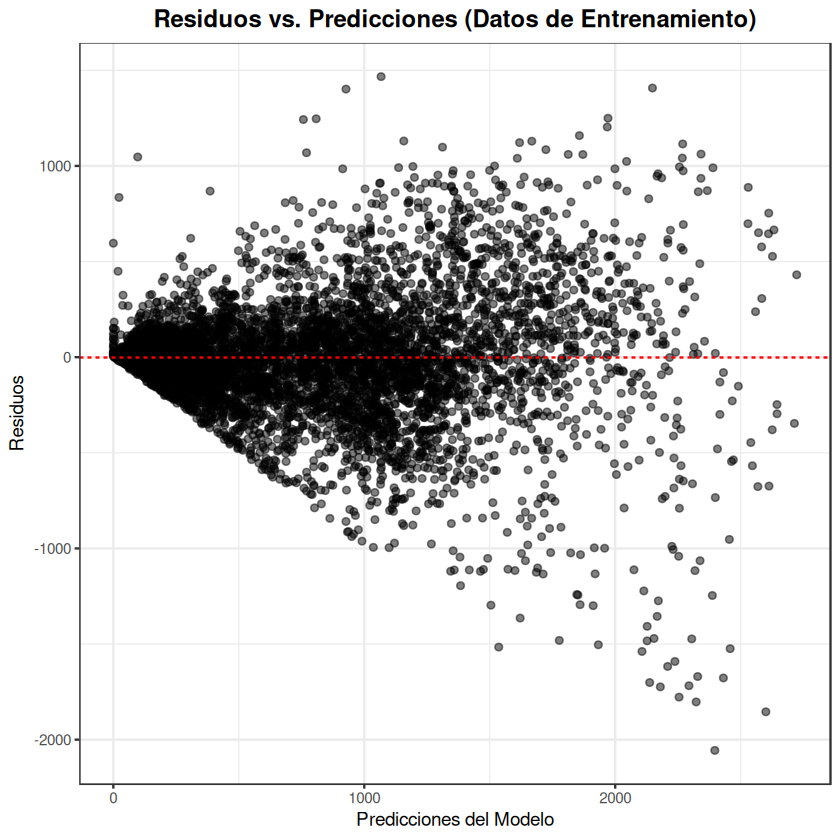

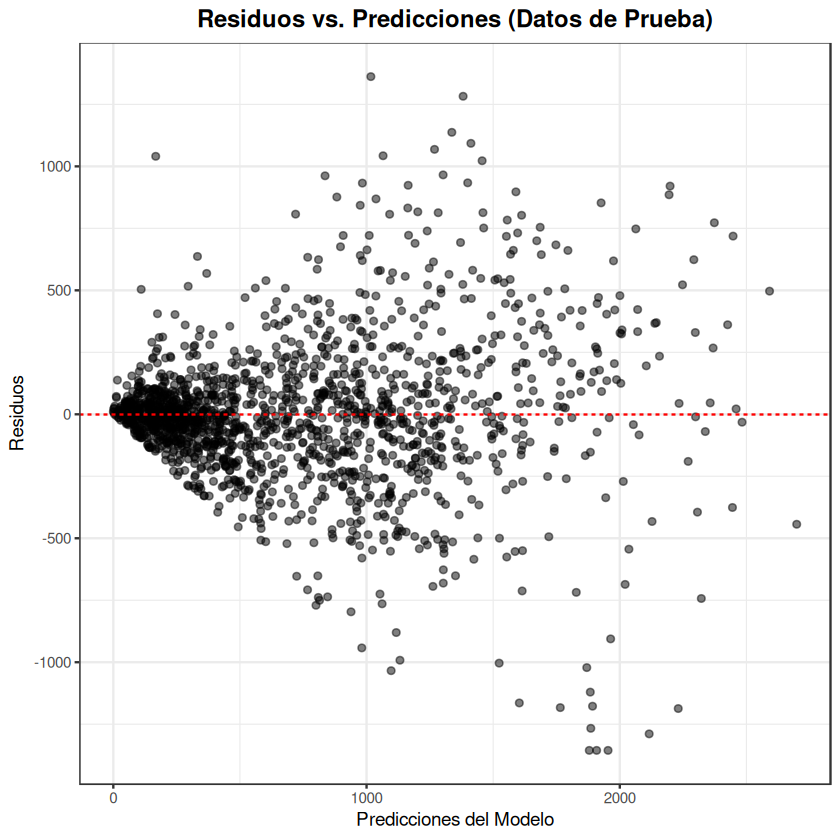

In [42]:
# 2. Visualización de Residuos vs. Valores Predichos (Datos de Entrenamiento)
ggplot(lm6_poisson_train_predictions, aes(x = .pred, y = residuals)) +
  geom_point(alpha = 0.5) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  labs(
    title = "Residuos vs. Predicciones (Datos de Entrenamiento)",
    x = "Predicciones del Modelo",
    y = "Residuos"
  ) +
  theme_bw() +
  theme(plot.title = element_text(hjust = 0.5, face = "bold", size = 14))

# 3. Visualización de Residuos vs. Valores Predichos (Datos de Prueba)
ggplot(lm6_poisson_test_predictions, aes(x = .pred, y = residuals)) +
  geom_point(alpha = 0.5) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  labs(
    title = "Residuos vs. Predicciones (Datos de Prueba)",
    x = "Predicciones del Modelo",
    y = "Residuos"
  ) +
  theme_bw() +
  theme(plot.title = element_text(hjust = 0.5, face = "bold", size = 14))

### Heteroscedasticity conditions are observed. The homoscedasticity criterion for the residuals is not met.

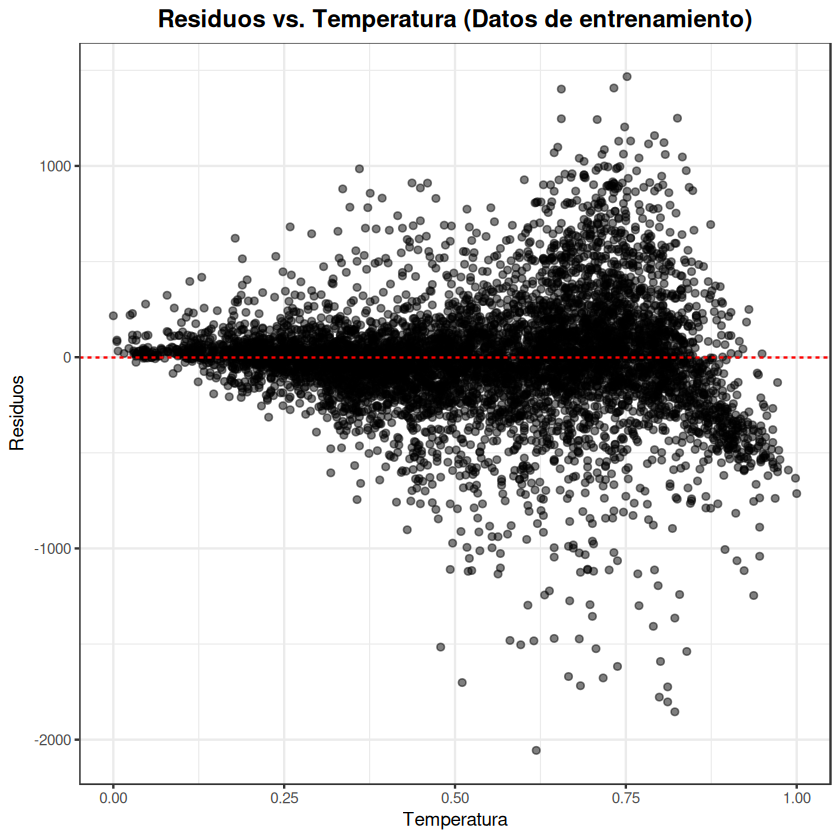

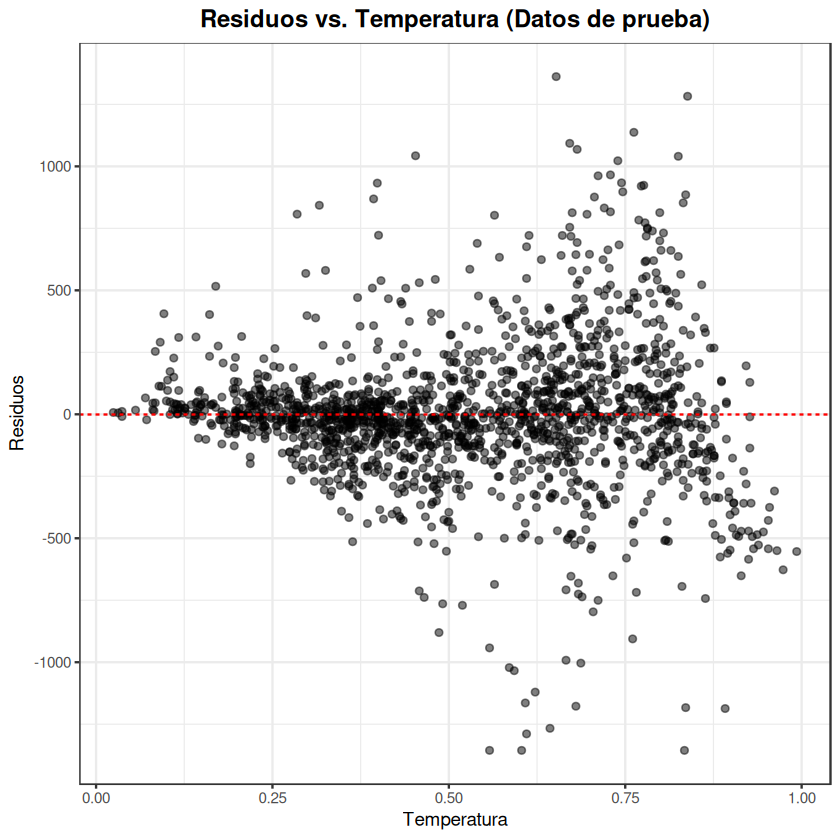

In [43]:
# 4. Visualización de Residuos vs. Variables Predictoras Clave (Ejemplo con Temperatura)
# Puedes repetir este gráfico para otras variables predictoras que consideres importantes
ggplot(lm6_poisson_train_predictions, aes(x = TEMPERATURE, y = residuals)) +
  geom_point(alpha = 0.5) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  labs(
    title = "Residuos vs. Temperatura (Datos de entrenamiento)",
    x = "Temperatura",
    y = "Residuos"
  ) +
  theme_bw() +
  theme(plot.title = element_text(hjust = 0.5, face = "bold", size = 14))

ggplot(lm6_poisson_test_predictions, aes(x = TEMPERATURE, y = residuals)) +
  geom_point(alpha = 0.5) +
  geom_hline(yintercept = 0, linetype = "dashed", color = "red") +
  labs(
    title = "Residuos vs. Temperatura (Datos de prueba)",
    x = "Temperatura",
    y = "Residuos"
  ) +
  theme_bw() +
  theme(plot.title = element_text(hjust = 0.5, face = "bold", size = 14))

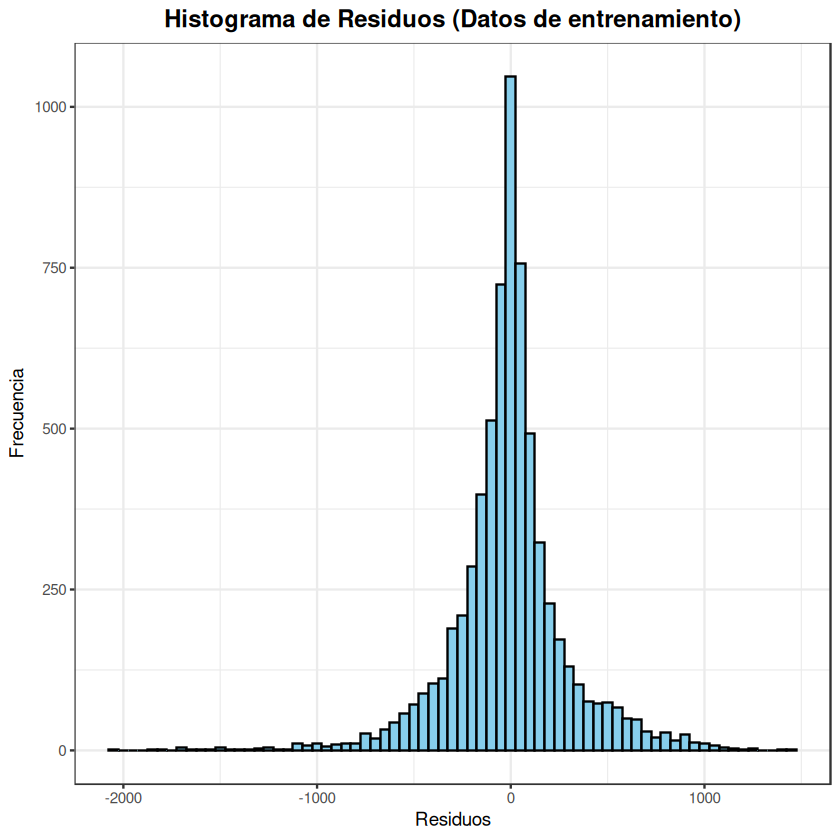

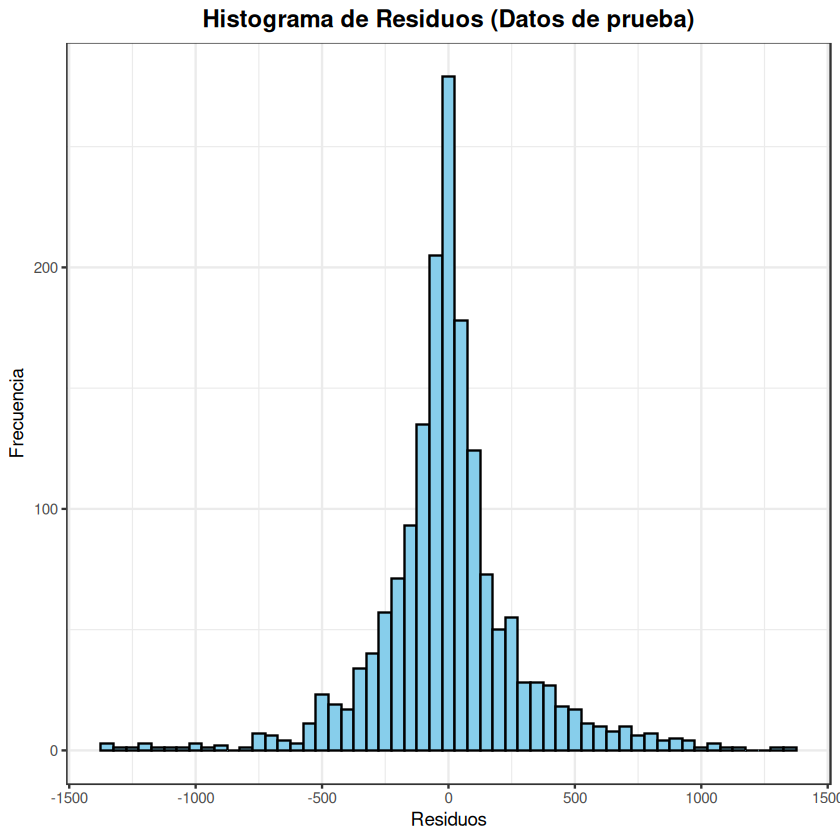

In [44]:
# 5. Histograma de Residuos (para verificar normalidad de los errores)
ggplot(lm6_poisson_train_predictions, aes(x = residuals)) +
  geom_histogram(binwidth = 50, fill = "skyblue", color = "black") +
  labs(
    title = "Histograma de Residuos (Datos de entrenamiento)",
    x = "Residuos",
    y = "Frecuencia"
  ) +
  theme_bw() +
  theme(plot.title = element_text(hjust = 0.5, face = "bold", size = 14))

ggplot(lm6_poisson_test_predictions, aes(x = residuals)) +
  geom_histogram(binwidth = 50, fill = "skyblue", color = "black") +
  labs(
    title = "Histograma de Residuos (Datos de prueba)",
    x = "Residuos",
    y = "Frecuencia"
  ) +
  theme_bw() +
  theme(plot.title = element_text(hjust = 0.5, face = "bold", size = 14))

### A normal distribution of the residuals is observed. The assumption of linear regression is verified.

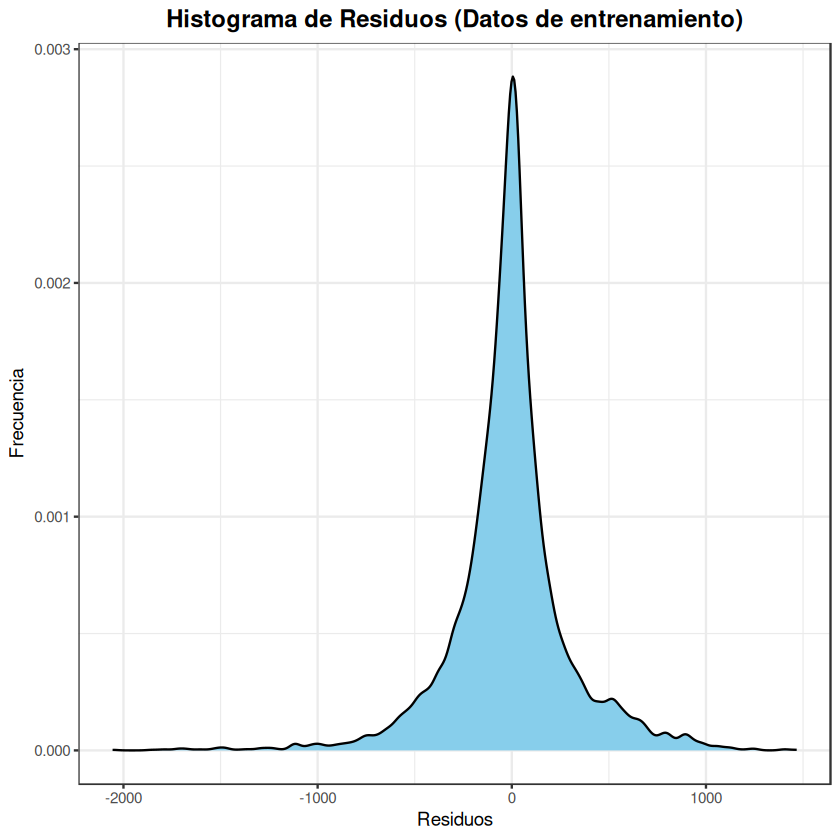

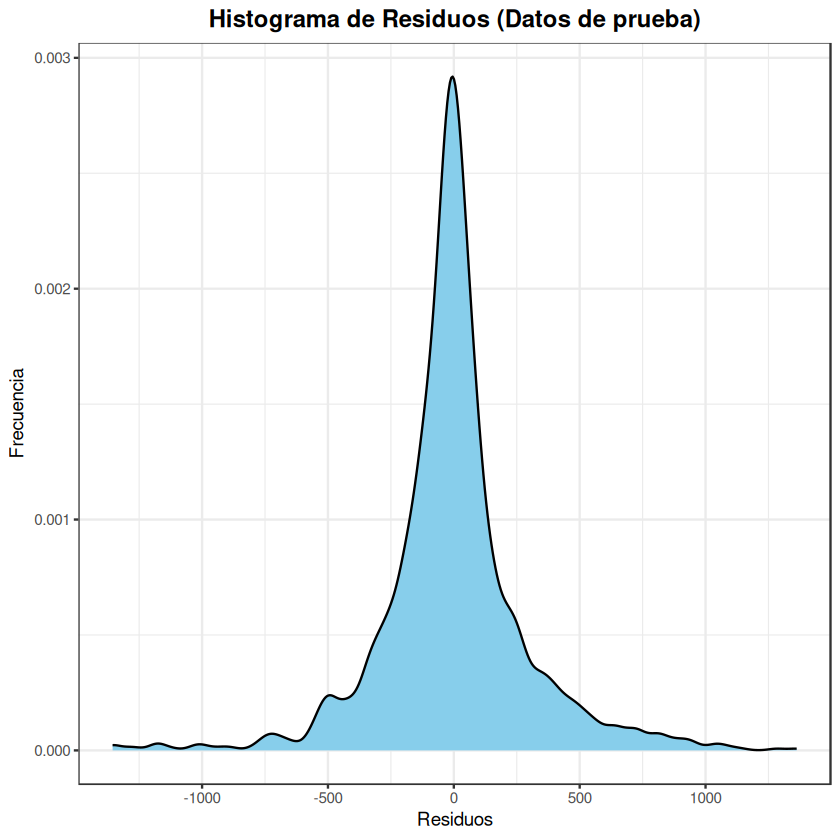

In [45]:
# 5. Histograma de Residuos (para verificar normalidad de los errores)
ggplot(lm6_poisson_train_predictions, aes(x = residuals)) +
  geom_density(fill = "skyblue", color = "black") +
  labs(
    title = "Histograma de Residuos (Datos de entrenamiento)",
    x = "Residuos",
    y = "Frecuencia"
  ) +
  theme_bw() +
  theme(plot.title = element_text(hjust = 0.5, face = "bold", size = 14))

ggplot(lm6_poisson_test_predictions, aes(x = residuals)) +
  geom_density(fill = "skyblue", color = "black") +
  labs(
    title = "Histograma de Residuos (Datos de prueba)",
    x = "Residuos",
    y = "Frecuencia"
  ) +
  theme_bw() +
  theme(plot.title = element_text(hjust = 0.5, face = "bold", size = 14))